CVAEをjupyter notebookで実装
（もしかしたらこっちの方が便利かも）

# データ前処理
1. フィルタ処理
2. 心拍の分割（「PrePost; ピーク前a秒、ピーク後b秒」or 「IBI; Interbeat interval」）
3. ドップラー波をCWT

## 前処理に必要なライブラリのimport & 関数定義

In [39]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import codecs
import os
import re
from tqdm import tqdm
from pathlib import Path
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import interpolate

# CWT
import math
import pycwt
import cv2 # CWT後画像リサイズ（補間）に用いる

# 自作関数
import sys
sys.path.append('..')
import sig_proc

def dist_HR(data, peak_times, peak_vals, mode, sampling_rate=128, pre_sec=0.2, post_sec=0.6):
    """
    R波のピークtoピーク(IBI: Inter-Beat Interval)で心拍データを分けてみる

    Parameters
    ----------
    data : ndarray
        入力データ(1行目ECG, 2行目DOPPLER(I-Q差分)を想定)。
    peak_times : list
        ピーク列(インデックス)。
    peai_vals : list
        ピーク列(値)。
    mode : str
        分割モード指定。'PrePost' or 'IBI'.
    sampling_rate : int
        サンプリングレート。PrePostモードでのみ使用。
    pre_sec : float
        R波ピーク前の何秒間を切り出すかを指定。PrePostモードでのみ使用。
    post_sec : float
        R波ピーク後の何秒間を切り出すかを指定。PrePostモードでのみ使用。

    Returns
    -------
    data_out : list of ndarray
        IBIのデータ（ndarray）が格納された配列
    """
    THRESHOLD = 300.0 # これよりピーク値小さいものは異常値として判定することにする(ヒューリスティック)
    
    npeaks = len(peak_times)
    print(f"npeaks : {npeaks}")
    len_data = data.shape[1]
    data_out = []

    if mode == 'PrePost':
        pre_sample_num, post_sample_num = int(pre_sec*sampling_rate), int(post_sec*sampling_rate)
        for idx, val in zip(peak_times, peak_vals):
            # not (明らかにR波ピークを誤検出しているもの or ピーク前のデータ数が不足しているもの or ピーク後のデータ数が不足しているもの)
            if val > THRESHOLD and pre_sample_num <= idx <= (len_data - post_sample_num):
                data_temp = data[:,idx-pre_sample_num:idx+post_sample_num]
                data_out.append(data_temp)

    if mode == 'IBI':
        for i in range(npeaks - 1):
            # 明らかにR波ピークを誤検出しているものは触らない
            if peak_vals[i] > THRESHOLD or peak_vals[i+1] > THRESHOLD:
                data_temp = data[:,peak_times[i]:peak_times[i+1]]
                data_out.append(data_temp)
        
    return data_out

# ecgとdopplerを並べてプロットする関数
def ecg_doppler_plot(time_array, ecg, doppler, wave, freqs, doppler_filter=False, filter_l=None, filter_h=None, figtitle='title', figsize=(18,10), fontsize=20, labelsize=20, savefig=False, figpath='./title.png'):
    fig = plt.figure(figsize=figsize)
    # ECG time
    ax1 = fig.add_subplot(311)
    ax1.plot(time_array,ecg,color='tab:orange',label='ECG')
    ax1.set_ylabel('Voltage [mV]', fontsize=fontsize)
    ax1.legend(fontsize=fontsize)
    plt.tick_params(labelsize=labelsize)

    # doppler time
    ax2 = fig.add_subplot(312, sharex=ax1)
    # フィルタ処理をしている場合、グラフのタイトルにその範囲を書くだけのために分岐しています
    if doppler_filter:
        ax2.set_ylim([-100,100])
        ax2.plot(time_array,doppler,color='tab:blue',label=f'doppler(I-Q,{filter_l}~{filter_h}Hz)')
    else:
        ax2.plot(time_array,doppler,color='tab:blue',label=f'doppler(I-Q')
    ax2.set_ylabel('Voltage [mV]', fontsize=fontsize)
    ax2.legend(fontsize=fontsize)
    plt.tick_params(labelsize=labelsize)

    # doppler CWT
    ax3 = fig.add_subplot(313, sharex=ax1)
    pcm = ax3.pcolormesh(time_array, freqs, np.abs(wave), vmin=0, shading='auto')
    ax3.set_ylabel('Frequency [Hz]', fontsize=fontsize)
    ax3.set_xlabel('Time [sec]', fontsize=fontsize)
    plt.tick_params(labelsize=labelsize)
    # cax = fig.add_axes() # ここからカラーバー
    divider1 = make_axes_locatable(ax3)
    cax = divider1.append_axes("right", size="2%", pad = 0.1)
    cbar = plt.colorbar(pcm,orientation='vertical',cax=cax)
    cbar.ax.tick_params(right='off', labelsize=labelsize)

    fig.suptitle(figtitle, fontsize=20)
    # サイズをそろえる（ピークの位置見やすいように）cf)https://qiita.com/sbajsbf/items/b3ce138de83362bc45b0
    fig.canvas.draw()
    axpos1 = ax1.get_position() # ECGの描画領域
    axpos2 = ax2.get_position() # doppler(time)の描画領域
    axpos3 = ax3.get_position() # doppler(CWT)の描画領域
    ax1.set_position([axpos1.x0, axpos1.y0, axpos3.width, axpos1.height])
    ax2.set_position([axpos2.x0, axpos2.y0, axpos3.width, axpos2.height])

    # x軸共有のため、上二つのラベルは非表示にする
    plt.setp(ax1.get_xticklabels(), visible=False)
    plt.setp(ax2.get_xticklabels(), visible=False)

    # 右と上の枠線を消すcf)https://qiita.com/irs/items/fe909442be057f0efb48
    for ax in [ax1, ax2, ax3]:
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['left'].set_linewidth(5)
        ax.spines['bottom'].set_linewidth(5)
        ax.xaxis.set_tick_params(direction='in',bottom=True,top=False,left=False,right=False,length=10,width=5)
        ax.yaxis.set_tick_params(direction='in',bottom=True,top=False,left=False,right=False,length=5,width=5)
    
    # fig.tight_layout(rect=[0,0,1,0.96]) # rect指定の順番は左下原点で(left,bottom,right,top). suptitle+tight_layout組み合わせる場合は注意
    fig.patch.set_facecolor('white') # 背景色を白にする

    # 画像保存
    if savefig:
        fig.savefig(figpath)
    plt.show()

    
def data_plot_after_splitting(ecg_list, doppler_list, doppler_cwt_list, freqs_list, npeaks, sampling_rate=128, figtitle='title', savefig=False, figpath='./title.png', fontsize=20):
    """分割プロット"""
    if npeaks <= 10:
        nrow = 3
        ncol = npeaks
    else:
        ncol = 10
        nrow = -(-npeaks // ncol) * 3 # 切り上げ

    fig = plt.figure(figsize=(18,5*nrow/3))

    # 時系列波形
    for peak_idx in range(npeaks):
        ecg = ecg_list[peak_idx]
        doppler = doppler_list[peak_idx]
        wave = doppler_cwt_list[peak_idx]
        freqs = freqs_list[peak_idx]
        
        N = len(ecg) # サンプル点数
        time_array = np.arange(0,N) / sampling_rate # グラフ横軸（時間）
        
        wave_lim = wave[8:32,:]
        freqs_lim = freqs[8:32] # wavelet height = 24

        # ECG
        ax1 = fig.add_subplot(nrow,ncol,peak_idx+(peak_idx//ncol)*2*ncol+1)
        ax1.plot(time_array, ecg, color='tab:orange')

        # doppler(time)
        ax2 = fig.add_subplot(nrow,ncol,peak_idx+(peak_idx//ncol)*2*ncol+ncol+1, sharex=ax1)
        ax2.set_ylim([-100,100])
        ax2.plot(time_array, doppler, color='tab:blue')

        # doppler(CWT)
        ax3 = fig.add_subplot(nrow,ncol,peak_idx+(peak_idx//ncol)*2*ncol+2*ncol+1, sharex=ax1)
        # ax3.pcolormesh(time_array, freqs, sig_proc.zscore(np.abs(wave)), vmin=0, shading='auto')
        ax3.pcolormesh(time_array, freqs_lim, sig_proc.zscore(np.abs(wave_lim)), vmin=0, shading='auto')
        # ax3.set_ylabel('Frequency [Hz]')
        # ax3.set_xlabel('Time [sec]')
        #ax.set_ylim([3, 50])

        # x軸共有のため、上二つのラベルは非表示にする
        plt.setp(ax1.get_xticklabels(), visible=False)
        plt.setp(ax2.get_xticklabels(), visible=False)

        # 右と上の枠線を消すcf)https://qiita.com/irs/items/fe909442be057f0efb48
        for ax in [ax1, ax2, ax3]:
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            ax.spines['left'].set_linewidth(5)
            ax.spines['bottom'].set_linewidth(5)
            ax.xaxis.set_tick_params(direction='in',bottom=True,top=False,left=False,right=False,length=10,width=5)
            ax.yaxis.set_tick_params(direction='in',bottom=True,top=False,left=False,right=False,length=5,width=5)

    fig.suptitle(figtitle, fontsize=fontsize)
    fig.tight_layout(rect=[0,0,1,0.96]) # rect指定の順番は左下原点で(left,bottom,right,top). suptitle+tight_layout組み合わせる場合は注意
    fig.patch.set_facecolor('white') # 背景色を白にする
    
    if savefig:
        fig.savefig(figpath) # 背景を透明にしたければtransparent=Trueオプションを付ければ良いっぽい
        
    plt.show()

## データ前処理：フィルタ->心拍の分割->周波数解析(.npzファイルに保存)

20220519_data\ble_20220517_140221_Manabe_5cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 54


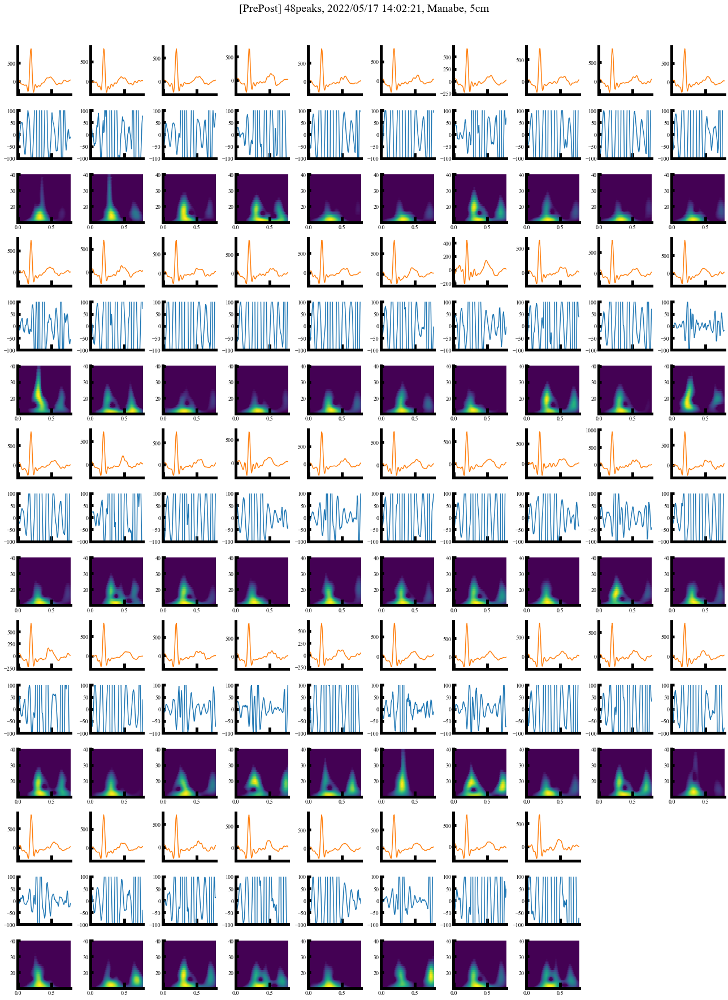

20220519_data\ble_20220517_141108_Manabe_30cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 50


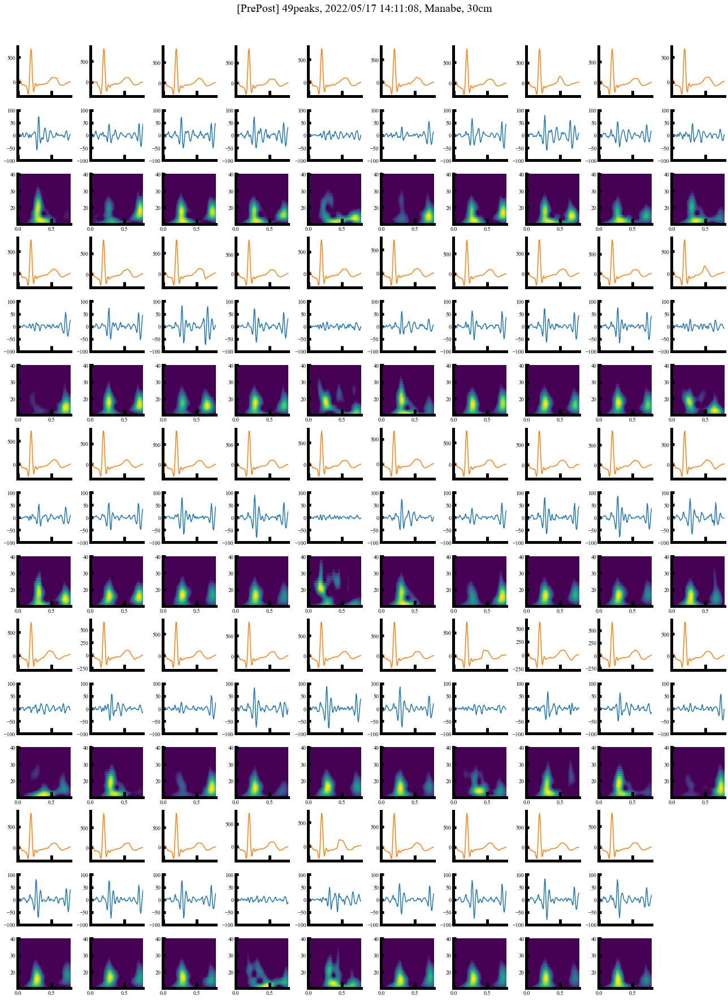

20220519_data\ble_20220517_141315_Manabe_50cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 50


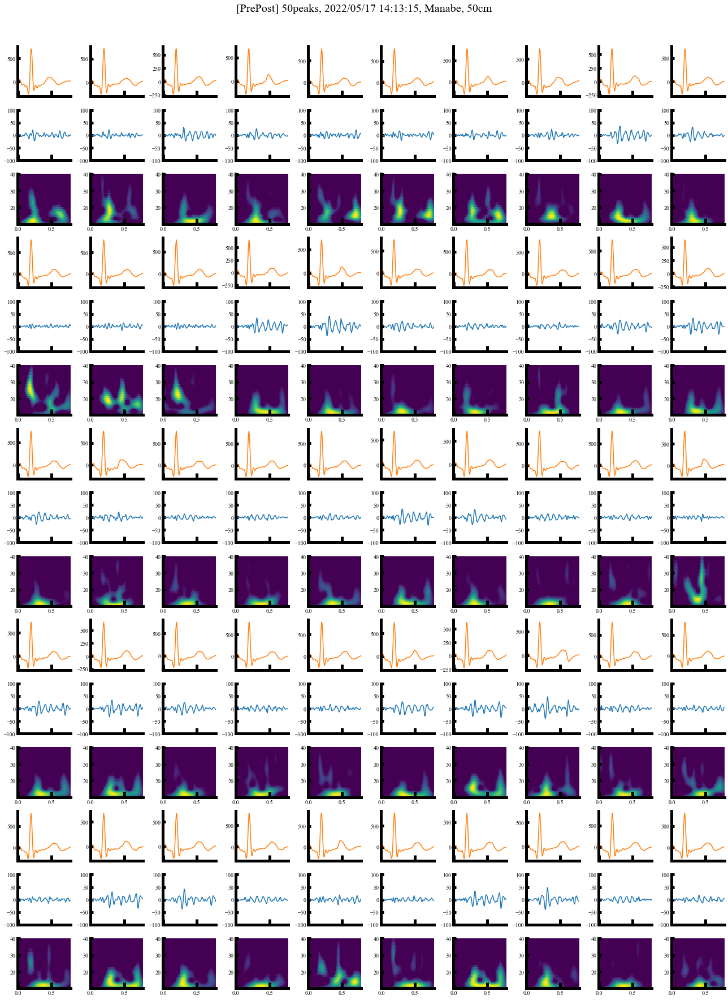

20220519_data\ble_20220517_145550_Yoshino_5cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 63


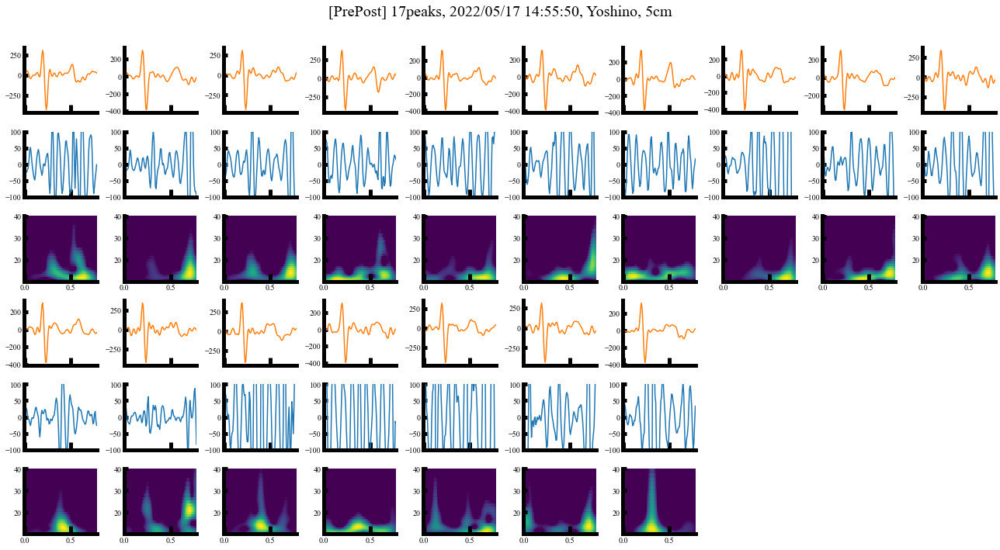

20220519_data\ble_20220517_145839_Yoshino_30cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 63


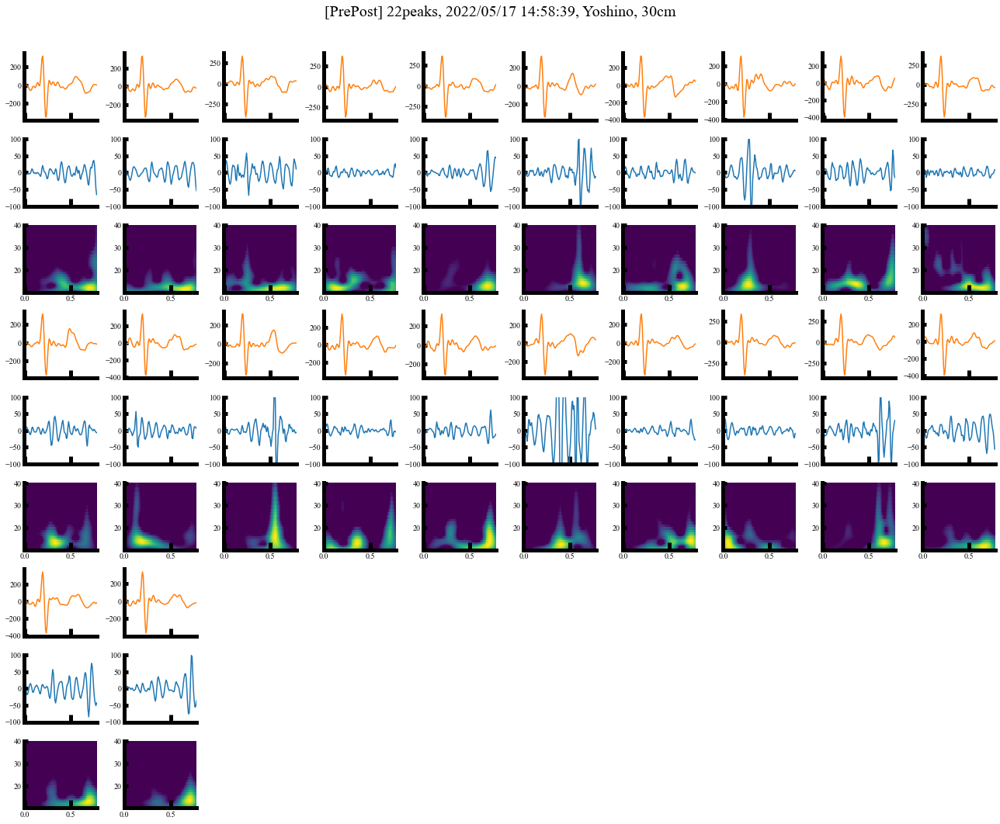

20220519_data\ble_20220517_150108_Yoshino_50cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 60


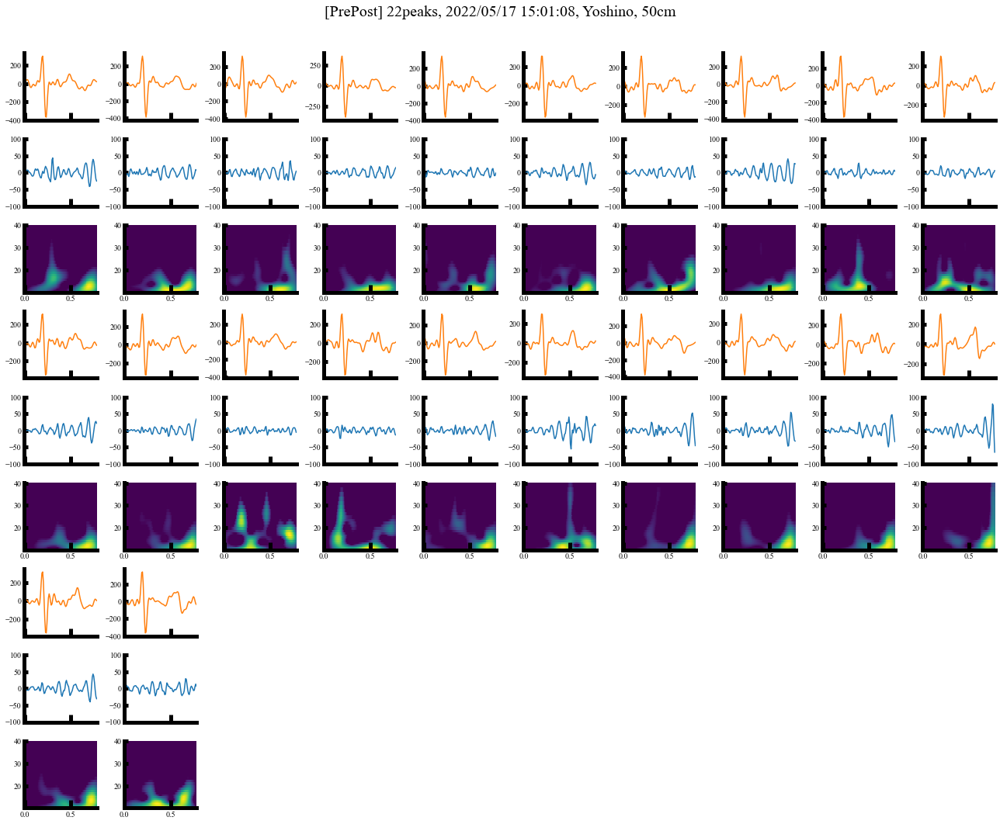

20220519_data\ble_20220517_151311_Yoshikura_5cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 54


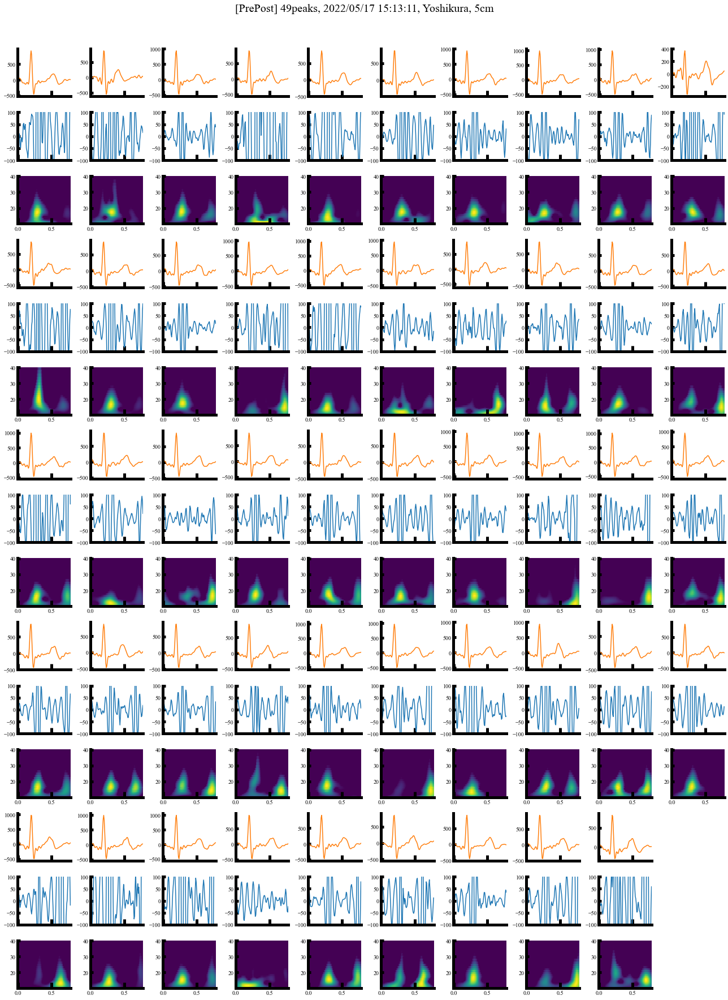

20220519_data\ble_20220517_151615_Yoshikura_30cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 57


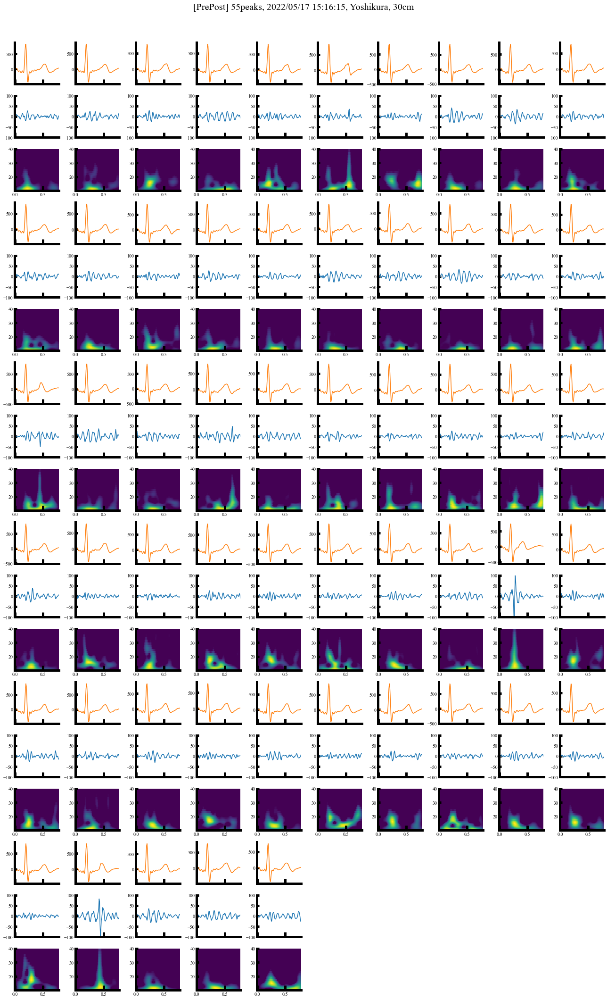

20220519_data\ble_20220517_151843_Yoshikura_50cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 55


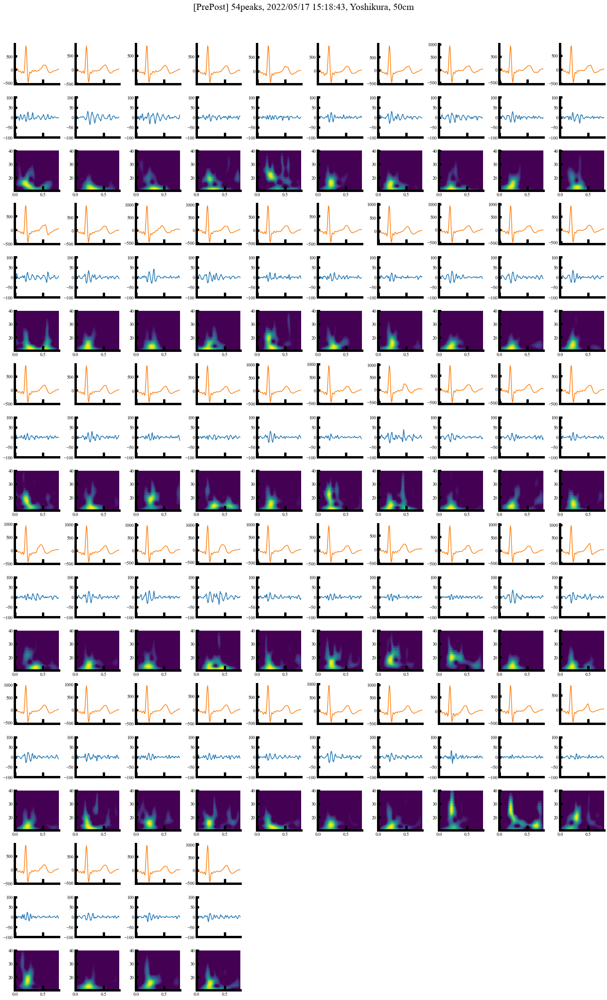

20220519_data\ble_20220517_154715_Ohashi_5cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 45


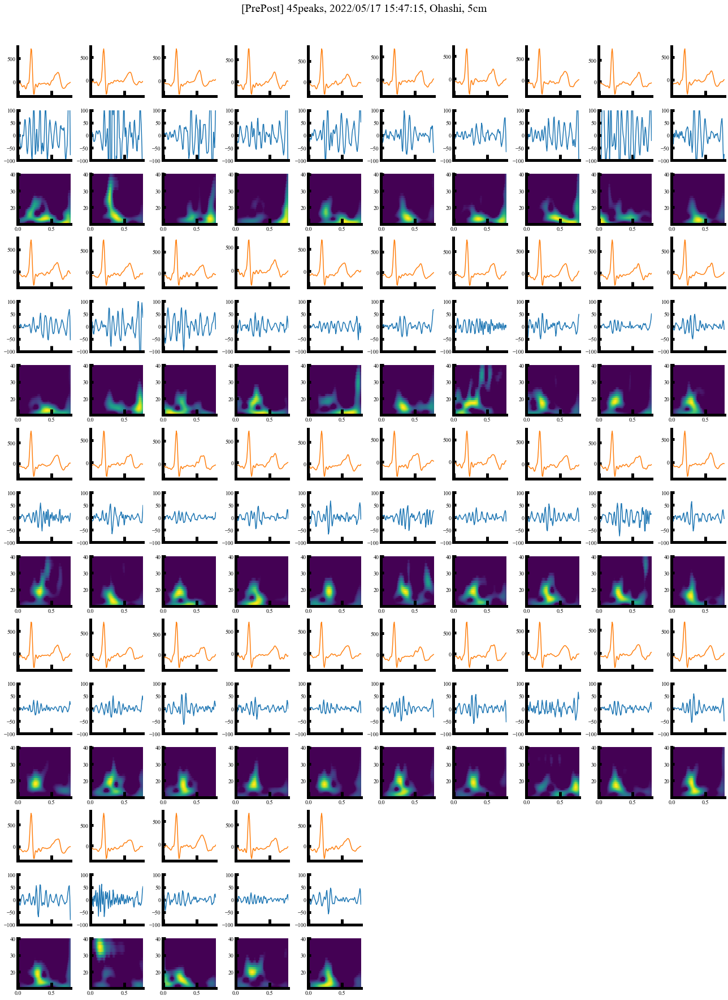

20220519_data\ble_20220517_155016_Ohashi_30cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 49


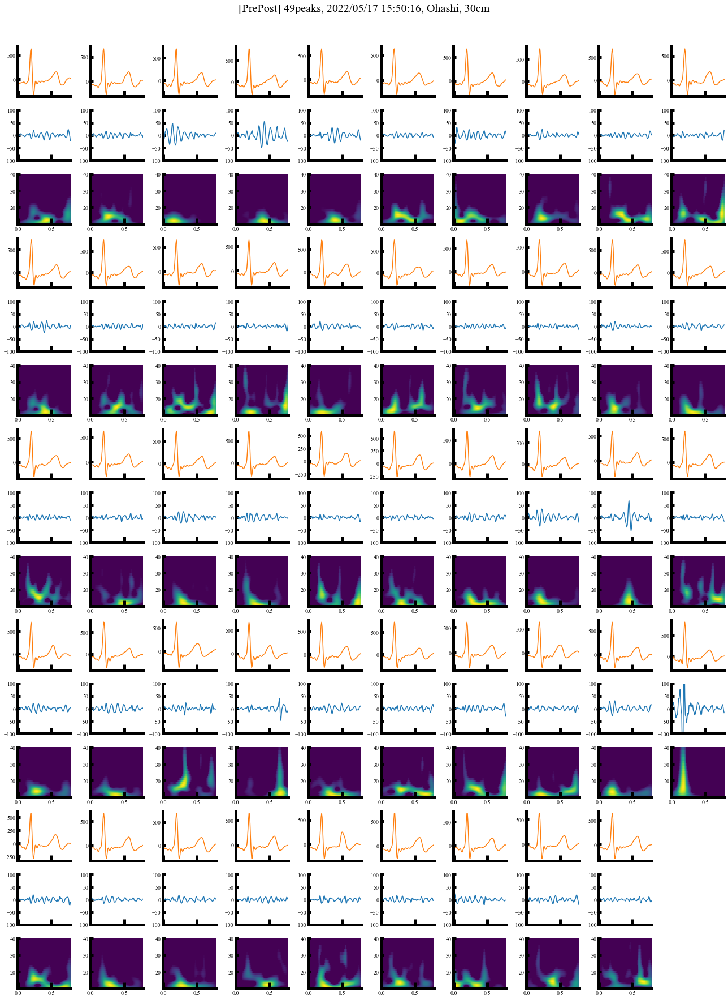

20220519_data\ble_20220517_155305_Ohashi_50cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 47


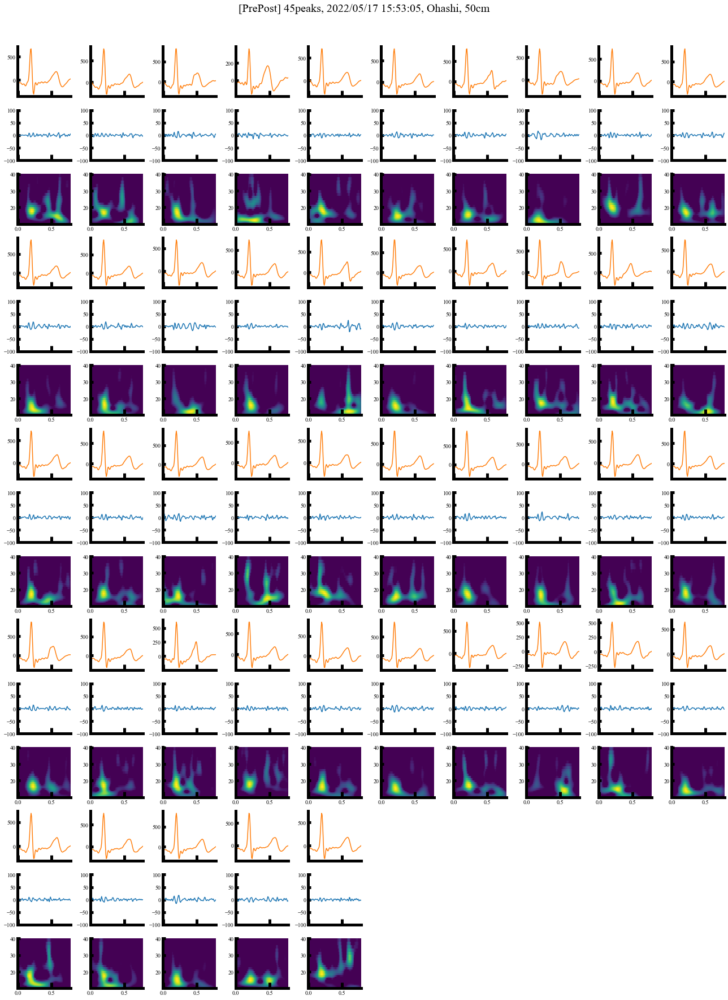

20220519_data\ble_20220517_155533_Ohashi_5cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 49


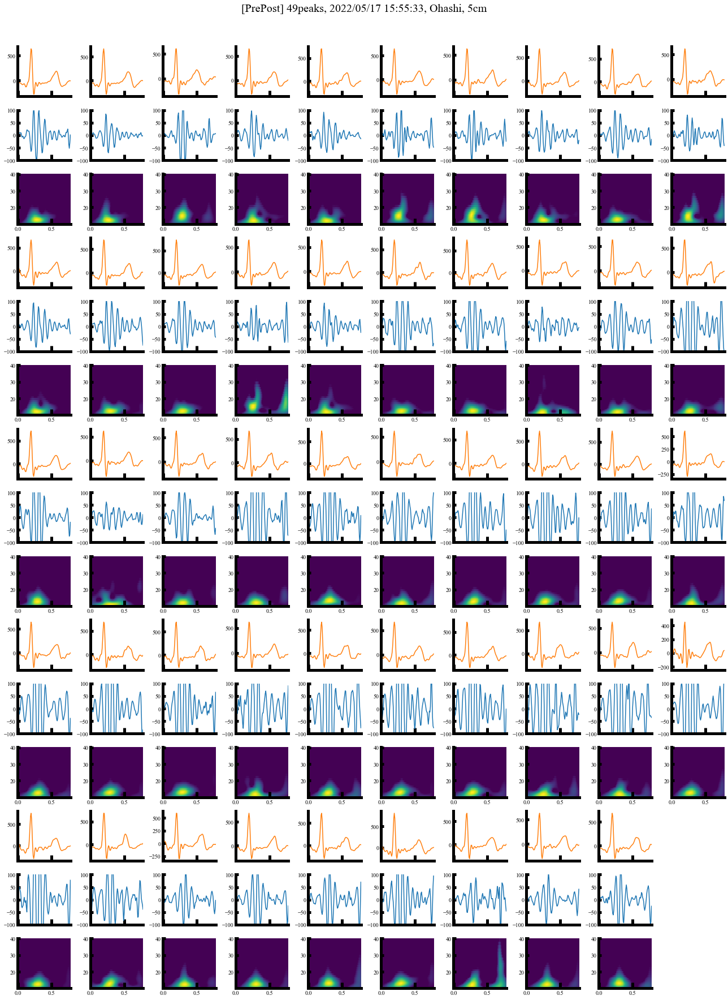

20220519_data\ble_20220517_160342_Emori_5cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 74


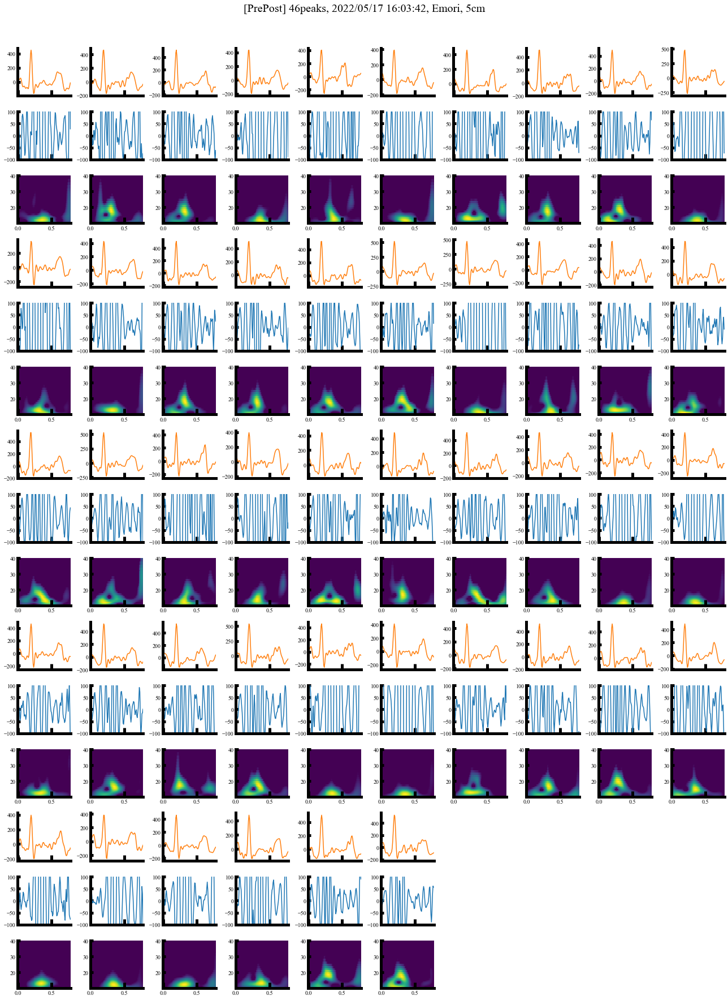

20220519_data\ble_20220517_160626_Emori_30cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 52


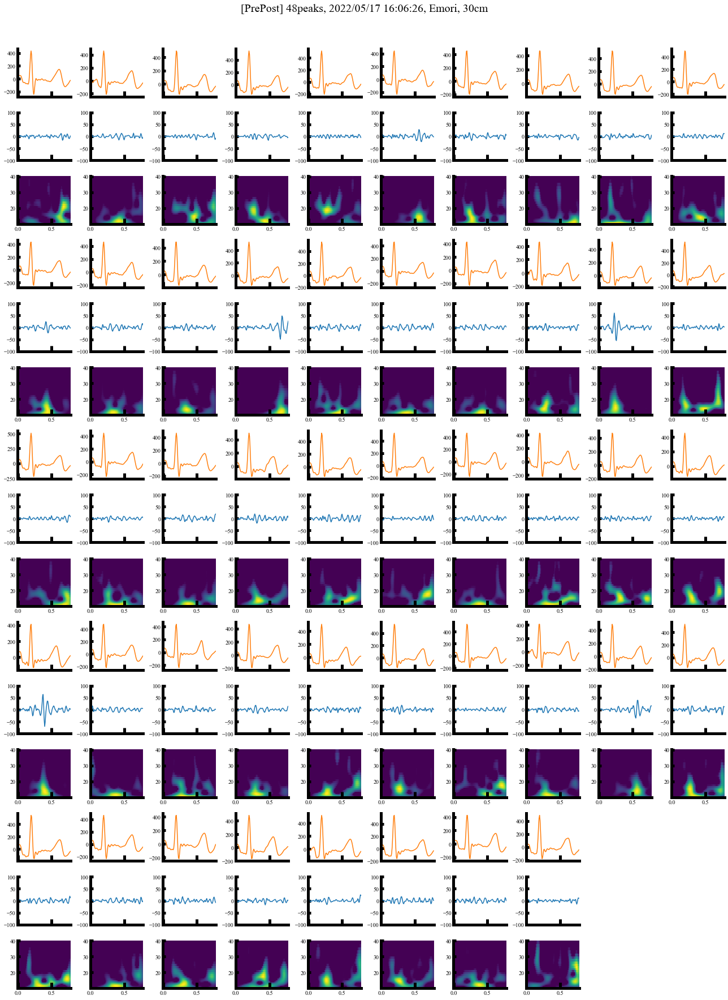

20220519_data\ble_20220517_160901_Emori_50cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 53


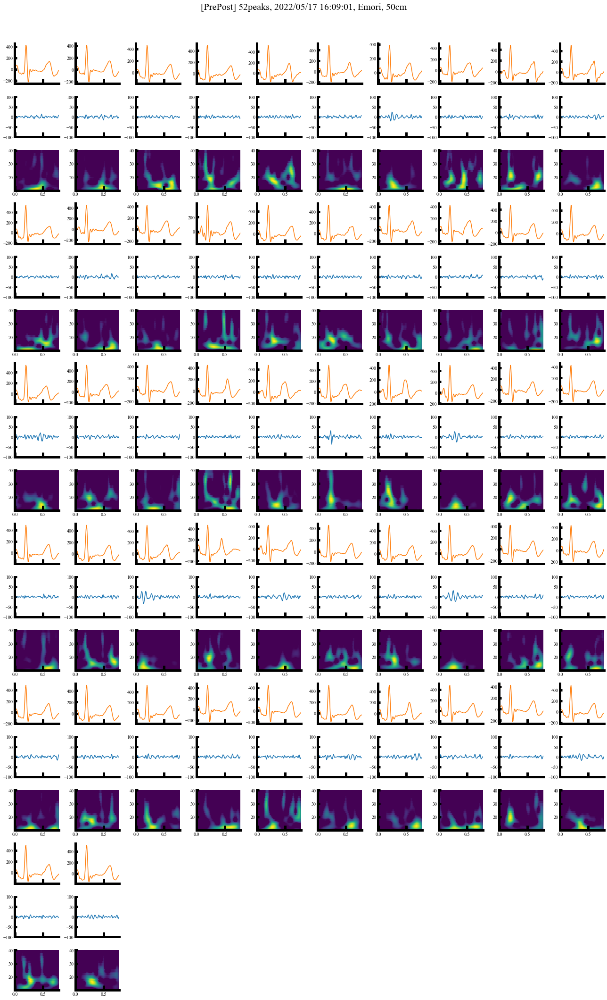

20220519_data\ble_20220517_165314_Hirayama_5cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 51


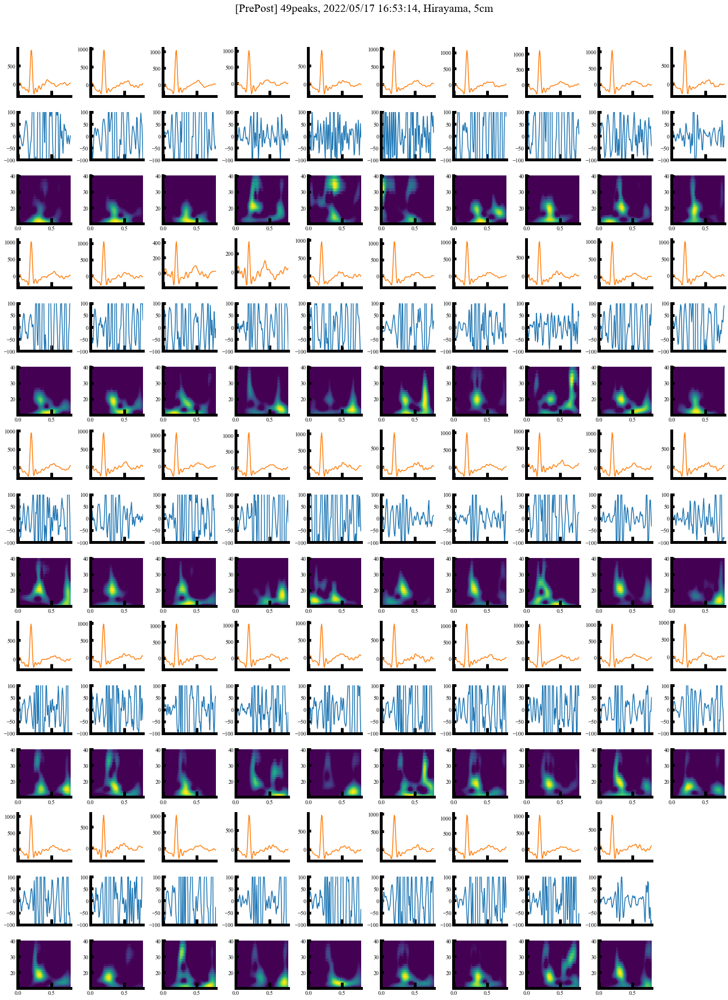

20220519_data\ble_20220517_165611_Hirayama_30cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 54


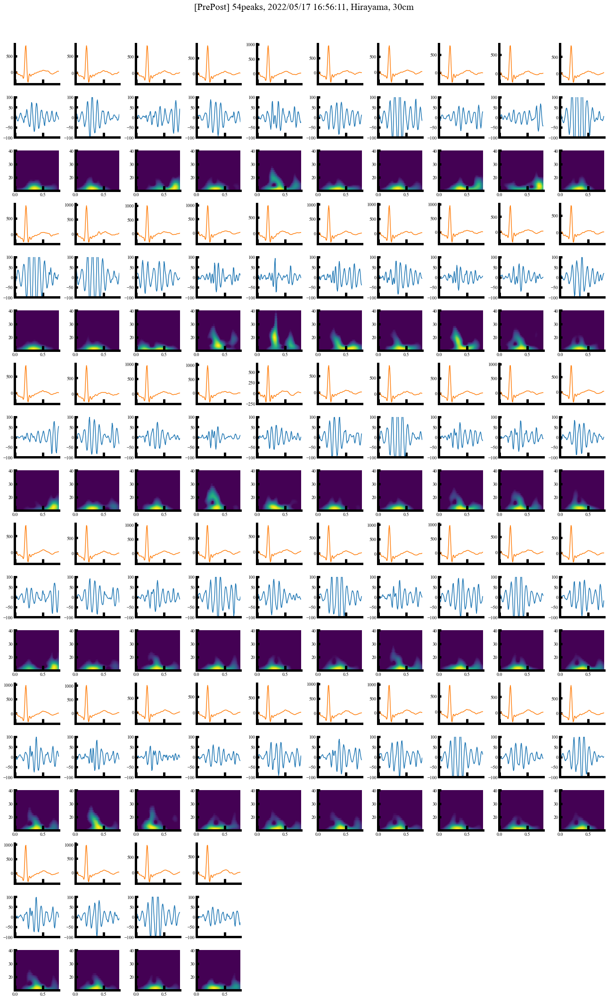

20220519_data\ble_20220517_165803_Hirayama_50cm_rec_front.csv
wave.shape=(144, 7680), len(freq)=144, freqs=(39.02785103463705, 10.337141955837549)
npeaks : 50


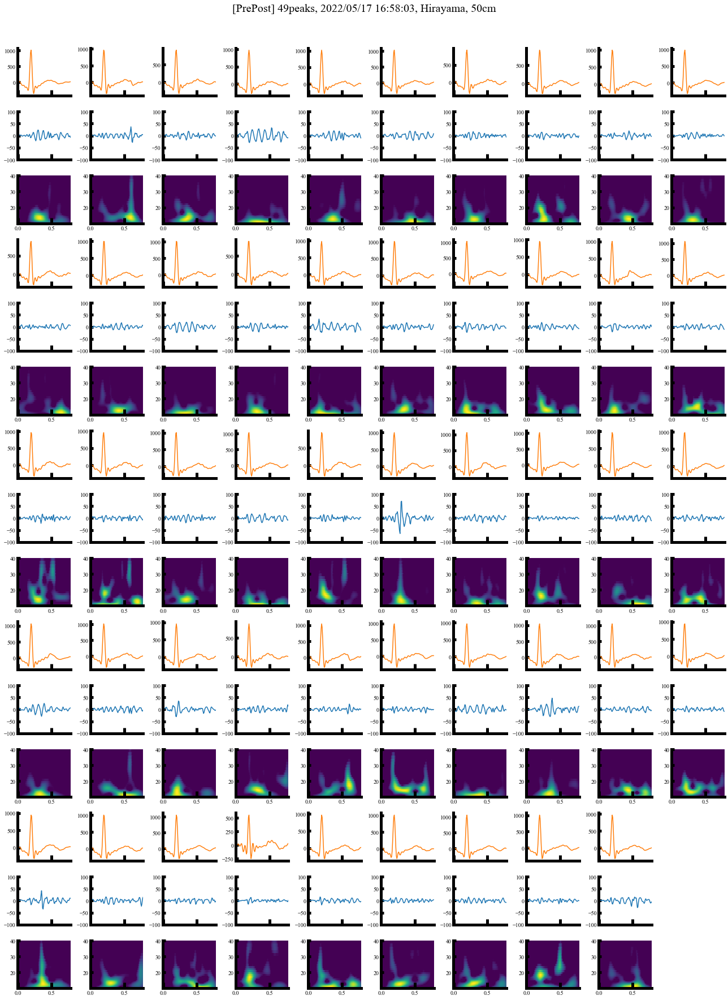

In [59]:
# ----- パラメータ

# 分割手法
DIST_MODE_LIST = ['PrePost','IBI']
DIST_MODE = DIST_MODE_LIST[0]

# 分割手法ごとに必要となるパラメータ
pre_sec, post_sec = 0.2, 0.6 # ピーク前後指定した秒数で分割する場合に用いるパラメータ
IBI_sample_len = 128 # IBIで分割する場合に用いるパラメータ；CWTをリサイズするときに指定するサンプル長

# データ出力先のディレクトリを指定
CWT_NPZ_DIR = 'CWT_NPZ'
if not os.path.exists(CWT_NPZ_DIR):
    os.mkdir(CWT_NPZ_DIR)

# 出力データのファイル名を指定
if DIST_MODE == DIST_MODE_LIST[0]:
    CWT_NPZ_FILENAME = f"{DIST_MODE}_pre{str(pre_sec).replace('.','')}_post{str(post_sec).replace('.','')}.npz"
if DIST_MODE == DIST_MODE_LIST[1]:
    CWT_NPZ_FILENAME = f'{DIST_MODE}_{IBI_sample_len}.npz'

data_out = {} # 出力データを保持するdict

freqs_start = 8 # 約40Hzに対応する周波数配列freqsのインデックス
freqs_end = 32 # 約10Hzに対応する周波数配列freqsのインデックス
wavelet_height = freqs_end - freqs_start # CWT後の2次元データの縦軸（周波数軸）を、フィルタ範囲で切り取った際の画像の高さ

START_SEC = 5 # 何秒から見るか
DURATION_SEC = 60 # 何秒間見るか

lpf_fp = 40
lpf_fs = 42
hpf_fp = 10
hpf_fs = 8

sma_num = 5

cmap = plt.cm.viridis

# --------------------------------------------------------------------------------------- #
data_dir_path = "./20220519_data/"
path_gen = Path(data_dir_path).glob("*.csv")

file_num = 0

# ファイル読み込み
for fname in path_gen:
    """################
    if file_num > 0:
        continue
    file_num += 1
    ################"""
    
    fname = str(fname)
    print(fname) # ex) 20220519_data\ble_20220517_140221_Manabe_5cm_rec_front.csv

    date, time = re.findall(r'_(\d+?_\d+?)_', fname)[0].split('_') # 正規表現で計測日と時刻を取得
    distance = re.findall(r'[A-Z][a-z]+_(.+?)_rec', fname)[0]
    name = re.findall(r'_([A-Z][a-z]+?)_', fname)[0]

    year, month, day = date[:4], date[4:6], date[6:]
    hour, minute, second = time[:2], time[2:4], time[4:]

    BLUETOOTH_MODE = True if "ble" in fname else False

    # 有線かBluetoothかどうかでパラメータを変える必要がある
    ch_num = 2 if BLUETOOTH_MODE else 7 # 計測データのチャネル数
    fs_org = 256 if BLUETOOTH_MODE else 500 # 計測時のサンプリングレート
    fs_ds = 128 if BLUETOOTH_MODE else 125 # ダウンサンプリング後のサンプリングレート
    thinning_num = 2 if BLUETOOTH_MODE else 4 # ダウンサンプリングでデータを間引くサンプル間隔

    dt_org = 1/fs_org
    dt_ds = 1/fs_ds

    start_sample = START_SEC*fs_org
    end_sample = (START_SEC+DURATION_SEC)*fs_org

    wave_fp = codecs.open(fname, 'r')

# ----- csvから2次元listへ
    times = []
    ch = []
    for i in range(ch_num):
        ch.append([])
    for idx2, line in enumerate(wave_fp):
        split_data = line.rstrip('\r\n').split(',')
        times.append(idx2)
        for i in range(ch_num):
            ch[i].append(int(float(split_data[i])))
    wave_fp.close()

# ----- 各信号（ECG/Doppler）を変数に格納
    ecg = ch[0][start_sample:end_sample] # ECG
    # doppler
    if BLUETOOTH_MODE:
        doppler = ch[-1][start_sample:end_sample]
    else:
        # i_1st = ch[1]
        i_2nd = ch[2]
        # q_1st = ch[3]
        q_2nd = ch[4]
        # iq_diff_1st = [i-q for (i,q) in zip(i_1st, q_1st)]
        iq_diff_2nd = [i-q for (i,q) in zip(i_2nd, q_2nd)]
        doppler = iq_diff_2nd[start_sample:end_sample]

# ----- フィルタ前プロット
    # time_array = np.arange(0,len(ecg))*dt_org # グラフ横軸（時間）
    # # CWT
    mother = pycwt.Morlet(6)
    # s0 = 2*dt_org # ウェーブレットの最小スケール。デフォルト値2dt。
    dj = 1/12 # 離散スケールの間隔。デフォルト値1/12。小さな値にするとスケール分解能が良くなるが、計算とプロットが遅くなる。
    # N = len(ecg) # サンプル点数
    # J =(math.log2(N * dt_org / s0))/dj # スケールの範囲s0からs0*2**(J*dj)までで、計(J+1)の尺度。

    # wave, _scales, freqs, _coi, _fft, _fftfreqs = pycwt.cwt(doppler, dt_org, dj, s0, J, mother)

    # ecg_doppler_plot(time_array,ecg,doppler,wave,freqs,figtitle=f"[raw]{fname}")

    ################################################################################
    #                                フィルタ                                      #
    ################################################################################

    # ECGのフィルタは多分これで確定でよい
    ecg = sig_proc.hpf(sig_proc.lpf(ecg, fs_org, fp=20, fs=25),fs_org,fp=3,fs=0.4)[::thinning_num]
    doppler = sig_proc.hpf(sig_proc.lpf(doppler,fs_org,fp=lpf_fp,fs=lpf_fs),fs_org,fp=hpf_fp,fs=hpf_fs)[::thinning_num]
    time_array = np.arange(0,len(ecg))*dt_ds # グラフ横軸（時間）

    # CWT
    s0 = 2*dt_ds # ウェーブレットの最小スケール。デフォルト値2dt。
    N = len(ecg) # サンプル点数
    J =(math.log2(N * dt_ds / s0))/dj # スケールの範囲s0からs0*2**(J*dj)までで、計(J+1)の尺度。
    wave, _scales, freqs, _coi, _fft, _fftfreqs = pycwt.cwt(doppler, dt_ds, dj, s0, J, mother)
    
    """
    ecg_doppler_plot(time_array,ecg,doppler,wave,freqs,
        doppler_filter=True,filter_l=hpf_fp,filter_h=lpf_fp,
        figtitle=f"[filter] {year}/{month}/{day} {hour}:{minute}:{second}, {name}, {distance}",
        savefig=False,
        figpath=f"{data_dir_path}{date}_{time}_{name}_{distance}.png")
    """

    print(f"wave.shape={wave.shape}, len(freq)={len(freqs)}, freqs={freqs[8], freqs[31]}")

    chnp = []
    chnp.append(np.array(ecg))
    chnp.append(np.array(doppler))
    data = np.vstack([chnp[0],chnp[1]])

    ################################################################################
    #                                　分割　                                      #
    ################################################################################

# ----- 時系列探索でPPGピーク検出＆分割
    # peak_times, peak_vals = sig_proc.peak_search(sig_proc.min_max(ecg), fs_ds)
    peak_times, peak_vals = sig_proc.peak_search(ecg, fs_ds)
    data_split = dist_HR(data, peak_times, peak_vals, mode=DIST_MODE, sampling_rate=fs_ds, pre_sec=pre_sec, post_sec=post_sec)
    
# ----- 分割後のドップラー波にCWTを適用
    npeaks = len(data_split)
    
    ecg_split = []
    doppler_split = []
    doppler_split_cwt = []
    freqs_list = []
    
    wavelet_data = np.empty(0) # 入力ファイルの心拍をまとめたndarrayを作る;最終的には（心拍数, 周波軸, 時間軸）の3D-ndarrayにreshapeする
    
    for peak_idx in range(npeaks):
        ecg = data_split[peak_idx][0]
        doppler = data_split[peak_idx][1]
        N = len(doppler) # サンプル点数
        time_array = np.arange(0,N)*dt_ds # グラフ横軸（時間）

        # CWT
        J =(math.log2(N * dt_ds / s0))/dj # スケールの範囲s0からs0*2**(J*dj)までで、計(J+1)の尺度。
        wave, _scales, freqs, _coi, _fft, _fftfreqs = pycwt.cwt(doppler, dt_ds, dj, s0, J, mother)
        
        # R波ピークで分割している場合、サンプル長を揃える
        if DIST_MODE == DIST_MODE_LIST[1]:
            wave_resized = cv2.resize(np.abs(wave), dsize=(IBI_sample_len, wave.shape[0]), interpolation=cv2.INTER_CUBIC)[freqs_start:freqs_end]
        if DIST_MODE == DIST_MODE_LIST[0]:
            wave_resized = wave[freqs_start:freqs_end]
        
        wavelet_data = np.append(wavelet_data, wave_resized) # 入力ファイルの心拍をまとめたndarrayを作る;最終的には（心拍数, 周波軸, 時間軸）の3D-ndarrayにreshapeする
        
        ecg_split.append(ecg)
        doppler_split.append(doppler)
        doppler_split_cwt.append(wave)
        freqs_list.append(freqs)
    
# ----- プロット
    data_plot_after_splitting(ecg_split, doppler_split, doppler_split_cwt, freqs_list, npeaks, sampling_rate=fs_ds,
                              figtitle=f"[{DIST_MODE}] {npeaks}peaks, {year}/{month}/{day} {hour}:{minute}:{second}, {name}, {distance}",
                              savefig=False,
                              figpath=f"{data_dir_path}({DIST_MODE}){date}_{time}_{name}_{distance}.png")
# ----- データの保持
    wavelet_data = np.reshape(wavelet_data, (npeaks, wavelet_height, -1))
    data_out[f"{npeaks}peaks, {year}/{month}/{day} {hour}:{minute}:{second}, {name}, {distance}"] = wavelet_data
    
# NPZで保存
np.savez(os.path.join(CWT_NPZ_DIR, CWT_NPZ_FILENAME), **data_out) # dictはアスタリスク2つでアンパックして指定することで、np.load()の際に直感的に構造化されたデータを扱うことができる。

### (メモ).npzファイルの確認
CVAEの学習用データセットを作成する前に、時間のかかるフィルタや時間周波数解析といった諸々の処理を済ませたものを一旦保存しておいた。

利用する際には、np.load() 関数を用いる。

In [62]:
print(f"[{CWT_NPZ_FILENAME}]")
with np.load(os.path.join(CWT_NPZ_DIR, CWT_NPZ_FILENAME), allow_pickle=True) as loaded_data:
    for key in loaded_data.files: # files属性を見ることで、各ndarrayの名前を確認することができる。
        print(key)
        print(loaded_data[key].shape)

[PrePost_pre02_post06.npz]
48peaks, 2022/05/17 14:02:21, Manabe, 5cm
(48, 24, 101)
49peaks, 2022/05/17 14:11:08, Manabe, 30cm
(49, 24, 101)
50peaks, 2022/05/17 14:13:15, Manabe, 50cm
(50, 24, 101)
17peaks, 2022/05/17 14:55:50, Yoshino, 5cm
(17, 24, 101)
22peaks, 2022/05/17 14:58:39, Yoshino, 30cm
(22, 24, 101)
22peaks, 2022/05/17 15:01:08, Yoshino, 50cm
(22, 24, 101)
49peaks, 2022/05/17 15:13:11, Yoshikura, 5cm
(49, 24, 101)
55peaks, 2022/05/17 15:16:15, Yoshikura, 30cm
(55, 24, 101)
54peaks, 2022/05/17 15:18:43, Yoshikura, 50cm
(54, 24, 101)
45peaks, 2022/05/17 15:47:15, Ohashi, 5cm
(45, 24, 101)
49peaks, 2022/05/17 15:50:16, Ohashi, 30cm
(49, 24, 101)
45peaks, 2022/05/17 15:53:05, Ohashi, 50cm
(45, 24, 101)
49peaks, 2022/05/17 15:55:33, Ohashi, 5cm
(49, 24, 101)
46peaks, 2022/05/17 16:03:42, Emori, 5cm
(46, 24, 101)
48peaks, 2022/05/17 16:06:26, Emori, 30cm
(48, 24, 101)
52peaks, 2022/05/17 16:09:01, Emori, 50cm
(52, 24, 101)
49peaks, 2022/05/17 16:53:14, Hirayama, 5cm
(49, 24, 101)


### (メモ)二次元配列の補間
- torch.nn.functional.interpolate() と cv2.resize()を試した
- どっちも同じ補間方法を選択すれば結果は同じ
- 学習中にtorch Tensorをリサイズしたければ前者(torch)、そうでなければ後者(cv2)が圧倒的に楽

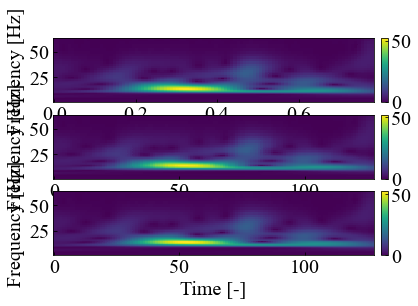

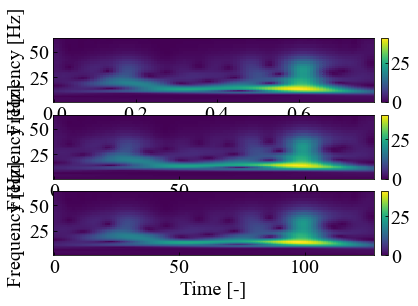

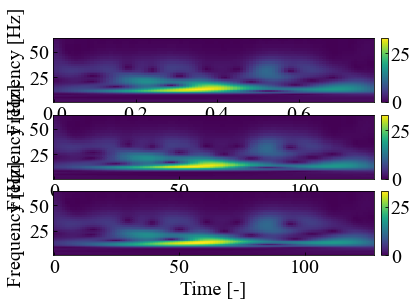

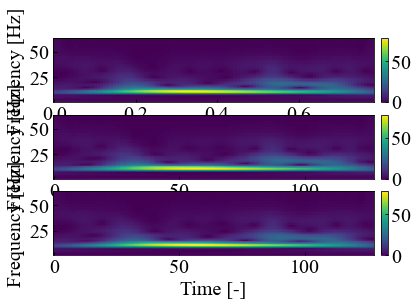

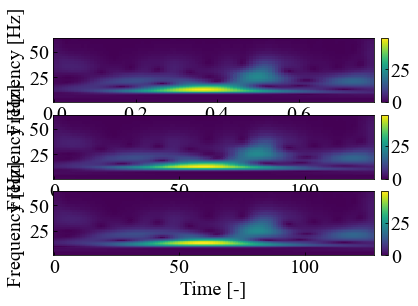

...

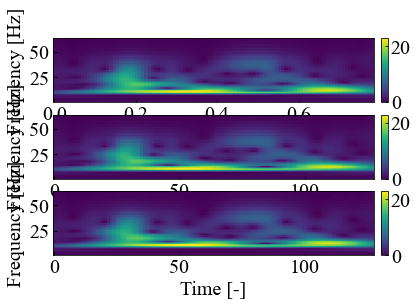

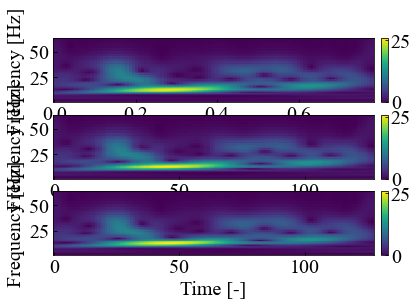

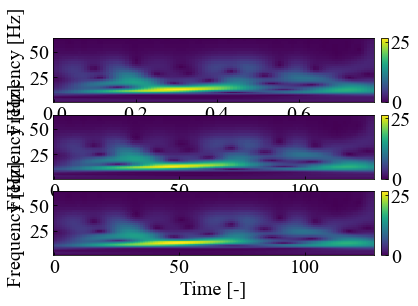

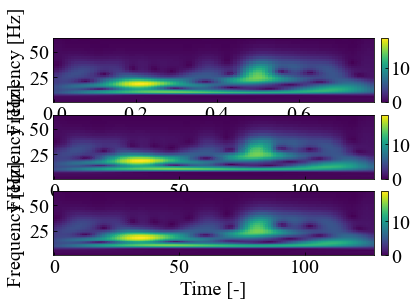

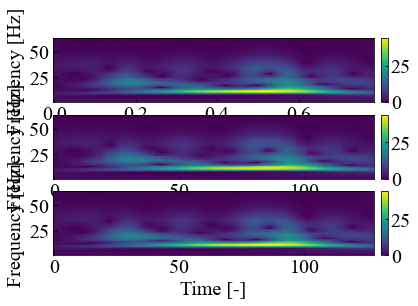

In [ ]:
import torch
import torch.nn.functional as F

import cv2

for i in range(npeaks):
    freqs = freqs_list[i]
    wave = doppler_split_cwt[i]
    
# ----- リサイズ手法1：pytorch(torch.nn.functional.interpolate)
    wave_torch = torch.from_numpy(np.abs(wave).astype(np.float32)).clone()
    wave_test = wave_torch.unsqueeze(0).clone()
    wave_test = wave_test.unsqueeze(0)
    wave_test = F.interpolate(wave_test, size=(wave_test.shape[2], 128), mode='area')
    wave_test = wave_test.squeeze()
    # print(f"{wave_torch.shape} -> {wave_test.shape}")
    
# ----- リサイズ手法2：opencvモジュール <- 学習中とかで無ければこっちが楽
    wave_cv2 = np.abs(wave)
    res = cv2.resize(wave_cv2, dsize=(128, wave_cv2.shape[0]), interpolation=cv2.INTER_CUBIC)
    # print(res.shape)
    
# ---- プロットで確認
    wave_test = wave_test.to('cpu').detach().numpy().copy()
    
    fig = plt.figure()
    ax1 = fig.add_subplot(311)
    time_array = np.arange(0,wave.shape[1]) * dt_ds
    pcm = ax1.pcolormesh(time_array, freqs, np.abs(wave), vmin=0, shading='auto')
    ax1.set_ylabel('Frequency [Hz]', fontsize=20)
    ax1.set_xlabel('Time [-]', fontsize=20)
    plt.tick_params(labelsize=20)
    # cax = fig.add_axes() # ここからカラーバー
    divider1 = make_axes_locatable(ax1)
    cax = divider1.append_axes("right", size="2%", pad = 0.1)
    cbar = plt.colorbar(pcm,orientation='vertical',cax=cax)
    cbar.ax.tick_params(right='off', labelsize=20)
    
    time_array = np.arange(0,128)
    ax2 = fig.add_subplot(312)
    pcm = ax2.pcolormesh(time_array, freqs, np.abs(wave_test), vmin=0, shading='auto')
    ax2.set_ylabel('Frequency [Hz]', fontsize=20)
    ax2.set_xlabel('Time [-]', fontsize=20)
    plt.tick_params(labelsize=20)
    # cax = fig.add_axes() # ここからカラーバー
    divider2 = make_axes_locatable(ax2)
    cax = divider2.append_axes("right", size="2%", pad = 0.1)
    cbar = plt.colorbar(pcm,orientation='vertical',cax=cax)
    cbar.ax.tick_params(right='off', labelsize=20)
    
    ax3 = fig.add_subplot(313)
    pcm = ax3.pcolormesh(time_array, freqs, np.abs(res), vmin=0, shading='auto')
    ax3.set_ylabel('Frequency [Hz]', fontsize=20)
    ax3.set_xlabel('Time [-]', fontsize=20)
    plt.tick_params(labelsize=20)
    # cax = fig.add_axes() # ここからカラーバー
    divider2 = make_axes_locatable(ax3)
    cax = divider2.append_axes("right", size="2%", pad = 0.1)
    cbar = plt.colorbar(pcm,orientation='vertical',cax=cax)
    cbar.ax.tick_params(right='off', labelsize=20)
    
    plt.show()
    plt.close()

# 機械学習

## CVAEモデルクラスの定義

In [69]:
import torch
import torch.nn as nn

INPUT_HEIGHT = 24 # 32
INPUT_WIDTH = 128 # 100

# q(z|x, y)
class Qz_xy(nn.Module):
    def __init__(self, z_dim=2, y_dim=10):
        super(Qz_xy, self).__init__()

        self.z_dim = z_dim

        # encode
        self.conv_e = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1),  # (32,100) ⇒ (16, 50)
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # (16, 50) ⇒ (8, 25)
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.fc1 = nn.Sequential(
            nn.Linear((INPUT_HEIGHT//4) * (INPUT_WIDTH//4)* 128,  40),
        )
        self.fc2 = nn.Sequential(
            nn.Linear((INPUT_HEIGHT//4) * (INPUT_WIDTH//4)* 128,  y_dim),
        )

        self.fc = nn.Sequential(
            nn.Linear(40+y_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 2*self.z_dim),
        )

    def forward(self, x, y):
        x = self.conv_e(x)
        x = x.view(-1,(INPUT_HEIGHT//4) * (INPUT_WIDTH//4)* 128)
        x1 = self.fc1(x)
        x2 = self.fc2(x)
        x = torch.cat([x1, x2*y], dim=1)
        x = self.fc(x)
        mu = x[:, :self.z_dim]
        logvar = x[:, self.z_dim:]
        z = self.reparameterize(mu, logvar)
        self.mu = mu
        self.logvar = logvar
        return z

    def reparameterize(self, mu, logvar):
        if self.training:
            std = logvar.mul(0.5).exp_()
            eps = std.new(std.size()).normal_()
            return eps.mul(std).add_(mu)
        else:
            return mu


# q(y|x)
class Qy_x(nn.Module):
    def __init__(self, y_dim=10):
        super(Qy_x, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4,padding=2),   # (32,100) ⇒ (33, 101)
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2)) # (33, 101) ⇒ (16, 50)

        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, padding=2), # (16, 50) ⇒ (17, 51)
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2)) # (17, 51) ⇒ (8, 25)

        self.fc =  nn.Sequential(
            nn.Linear(-(-INPUT_HEIGHT//4) * -(-INPUT_WIDTH//4)* 128, 256),
            nn.Dropout(p=0.4),
            nn.ReLU(),
            nn.Linear(256, y_dim),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        c1 = self.conv1(x)
        c2 = self.conv2(c1)
        c2_flat = c2.view(c2.size(0), -1)
        out = self.fc(c2_flat)
        return out

# p(z|y)
class Pz_y(nn.Module):
    def __init__(self, z_dim=2, y_dim=10):
        super(Pz_y, self).__init__()

        self.z_dim = z_dim

        # encode
        self.fc = nn.Sequential(
            nn.Linear(y_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 2*self.z_dim),
        )

    def forward(self, y):
        x = self.fc(y)
        mu = x[:, :self.z_dim]
        logvar = x[:, self.z_dim:]
        z = self.reparameterize(mu, logvar)
        self.mu = mu
        self.logvar = logvar
        return z

    def reparameterize(self, mu, logvar):
        if self.training:
            std = logvar.mul(0.5).exp_()
            eps = std.new(std.size()).normal_()
            return eps.mul(std).add_(mu)
        else:
            return mu

    def sample(self, y):
        x = self.fc(y)
        mu = x[:, :self.z_dim]
        logvar = x[:, self.z_dim:]
        std = logvar.mul(0.5).exp_()
        eps = std.new(std.size()).normal_()
        return eps.mul(std).add_(mu)

# p(x|z)
class Px_z(nn.Module):
    def __init__(self, z_dim=2):
        super(Px_z, self).__init__()

        self.z_dim = z_dim

        # decode
        self.fc = nn.Sequential(
            nn.Linear(self.z_dim, 40),
        )

        self.fc_d = nn.Sequential(
            nn.Linear(40, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024,(INPUT_HEIGHT//4) * (INPUT_WIDTH//4)* 128),
            nn.LeakyReLU(0.2)
        )
        self.conv_d = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1), # (8, 25) ⇒ (16, 50)
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(64, 1, kernel_size=4, stride=2, padding=1), # (16, 50) ⇒ (32, 100) 元通り！
            nn.Sigmoid()
        )

    def forward(self, z):
        z = self.fc(z)
        h = self.fc_d(z)
        h = h.view(-1, 128, (INPUT_HEIGHT//4), (INPUT_WIDTH//4))
        #print(h.shape)
        return self.conv_d(h)

class MyDataset(torch.utils.data.Dataset):

    def __init__(self, data, label, datatime_idx, transform=None):
        self.transform = transform
        self.data = data
        self.data_num = len(data)
        self.label = label
        self.datatime_idx = datatime_idx

    def __len__(self):
        return self.data_num

    def __getitem__(self, idx):
        if self.transform:
            # print(self.data.shape)
            # print(self.data[idx].shape)
            out_data = self.transform(self.data[idx])
            out_label = int(self.label[idx])
            out_datatime_idx = int(self.datatime_idx[idx])
        else:
            out_data = self.data[idx]
            out_label =  self.label[idx]
            out_datatime_idx = self.datatime_idx[idx]

        return out_data, out_label, out_datatime_idx

## 学習のための関数定義
各エポック内で行う学習処理やデータセット作成関数などを定義する。

### 損失関数

In [142]:
def KL_Cat(q, p, eps=1e-20):
    return (q * torch.log(q+eps) - q * torch.log(p+eps)).sum()

def KL_Gauss(mu1, logvar1, mu2, logvar2):
    #return -0.5 * torch.sum(1 + (logvar1 - logvar2) - (logvar1.exp() - logvar2.exp()) - (mu2 - mu1).pow(2) / logvar2.exp())
    #return -0.5 * torch.sum(1 + logvar1 - logvar2 - logvar1.exp()/logvar2.exp() - (mu2-mu1) ** 2 / logvar2.exp())
    #return -0.5 * torch.sum(1 + logvar1 - logvar2 - mu1.pow(2) + mu2.pow(2) - logvar1.exp() + logvar2.exp())
    return -0.5 * torch.sum(1 + (logvar1 - logvar2) - (((mu2 - mu1).pow(2))) - (logvar1.exp()/logvar2.exp()))

### trainとtest

In [143]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def train(K,pz_y,px_z,qy_x,qz_xy,train_loader,optimizer,ALPHA,BETA,device,epoch,DIR_OUT):
    pz_y.train()
    px_z.train()
    qy_x.train()
    qz_xy.train()

    total_loss = total_recon_loss = total_kl_gauss = total_Xent = 0.0
    t_list = []
    y_list = []
    z_xy_list = []
    z_y_list = []

    for x, t, _ in train_loader:
        x = x.to(device)
        t = t.to(device)
    # ----- クロスエントロピー項
        y = qy_x(x)
        Xent = nn.functional.cross_entropy(y, t, reduction="sum")
    # ----- 再構性項
        t_onehot = torch.eye(K)[t].to(device)
        z = qz_xy(x, t_onehot)
        # z = qz_xy(x, y) # これどっちが良いのか......
        # recon_x = px_z(z)
        # recon_loss = nn.functional.binary_cross_entropy(recon_x, x, reduction="sum")
    # ----- Prior Network Loss
        z_y = pz_y(t_onehot)
        kl_gauss = KL_Gauss(qz_xy.mu, qz_xy.logvar, pz_y.mu, pz_y.logvar)

        # 単純な疑問　生成時はPで揃えたほうがよかったりしない？（ｙ→ｚ→ｘで，p(z|y)→p(x|z)）
        # recon_x = px_z(z) これが従来
        recon_x = px_z(z_y)
        recon_loss = nn.functional.binary_cross_entropy(recon_x, x, reduction="sum")

        loss = recon_loss + kl_gauss*BETA + Xent*ALPHA
        total_loss += loss
        total_recon_loss += recon_loss
        total_kl_gauss += kl_gauss
        total_Xent += Xent

        y = y.argmax(dim=1).detach().cpu().numpy()
        t = t.detach().cpu().numpy()
        z = z.detach().cpu().numpy()
        z_y = z_y.detach().cpu().numpy()

        y_list.extend(y)
        t_list.extend(t)
        z_xy_list.extend(z)
        z_y_list.extend(z_y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_loss = total_loss / len(train_loader.dataset)
    avg_recon_loss = total_recon_loss / len(train_loader.dataset)
    avg_kl_gauss = total_kl_gauss / len(train_loader.dataset)
    avg_Xent = total_Xent / len(train_loader.dataset)
    y_array = np.array(y_list)
    t_array = np.array(t_list)
    avg_precision = precision_score(t_array,y_array,average='macro',zero_division=0)
    avg_recall = recall_score(t_array,y_array,average='macro',zero_division=0)
    avg_f1 = f1_score(t_array,y_array,average='macro',zero_division=0)

    z_xy_array = np.array(z_xy_list)
    z_y_array = np.array(z_y_list)
    #z_plot(z_xy_array,t_array,'qz_xy',epoch,DIR_OUT)
    #z_plot(z_y_array,t_array,'pz_y',epoch,DIR_OUT)

    return avg_loss, avg_recon_loss, avg_kl_gauss, avg_Xent, avg_precision, avg_recall, avg_f1

def test(K,pz_y,px_z,qy_x,qz_xy,dataloader,ALPHA,BETA,device):
    pz_y.eval()
    px_z.eval()
    qy_x.eval()
    qz_xy.eval()

    with torch.no_grad():
        total_loss = total_recon_loss = total_kl_gauss = total_Xent = 0.0
        t_list = []
        y_list = []

        for x, t, _ in dataloader:
            x = x.to(device)
            t = t.to(device)
        # ----- クロスエントロピー項
            y = qy_x(x)
            Xent = nn.functional.cross_entropy(y, t, reduction="sum")
        # ----- 再構性項
            t_onehot = torch.eye(K)[t].to(device)
            z = qz_xy(x, y)
            # recon_x = px_z(z)
            # recon_loss = nn.functional.binary_cross_entropy(recon_x, x, reduction="sum")
        # ----- Prior Network Loss
            z_y = pz_y(t_onehot)
            kl_gauss = KL_Gauss(qz_xy.mu, qz_xy.logvar, pz_y.mu, pz_y.logvar)

            recon_x = px_z(z_y)
            recon_loss = nn.functional.binary_cross_entropy(recon_x, x, reduction="sum")

            loss = recon_loss + kl_gauss*BETA + Xent*ALPHA
            total_loss += loss
            total_recon_loss += recon_loss
            total_kl_gauss += kl_gauss
            total_Xent += Xent

            y = y.argmax(dim=1).detach().cpu().numpy()
            t = t.detach().cpu().numpy()
            y_list.extend(y)
            t_list.extend(t)

    avg_loss = total_loss / len(dataloader.dataset)
    avg_recon_loss = total_recon_loss / len(dataloader.dataset)
    avg_kl_gauss = total_kl_gauss / len(dataloader.dataset)
    avg_Xent = total_Xent / len(dataloader.dataset)
    y_array = np.array(y_list)
    t_array = np.array(t_list)
    avg_precision = precision_score(t_array,y_array,average='macro',zero_division=0)
    avg_recall = recall_score(t_array,y_array,average='macro',zero_division=0)
    avg_f1 = f1_score(t_array,y_array,average='macro',zero_division=0)

    return avg_loss, avg_recon_loss, avg_kl_gauss, avg_Xent, avg_precision, avg_recall, avg_f1

def do_train_and_test(K,pz_y,px_z,qy_x,qz_xy,train_loader,test_loader,optimizer,epoch_num,device,ALPHA,BETA,DIR_OUT):
    history = {}
    history['train_loss'] = []
    history['train_recon_loss'] = []
    history['train_kl_gauss'] = []
    history['train_Xent'] = []
    history['train_precision'] = []
    history['train_recall'] = []
    history['train_f1'] = []

    history['test_loss'] = []
    history['test_recon_loss'] = []
    history['test_kl_gauss'] = []
    history['test_Xent'] = []
    history['test_precision'] = []
    history['test_recall'] = []
    history['test_f1'] = []

    for epoch in tqdm(range(epoch_num)):
        train_loss,train_recon_loss,train_kl_gauss,train_Xent,train_precision,train_recall,train_f1 = train(K,pz_y,px_z,qy_x,qz_xy,train_loader,optimizer,ALPHA,BETA,device,epoch,DIR_OUT)
        test_loss,test_recon_loss,test_kl_gauss,test_Xent,test_precision,test_recall,test_f1 = test(K,pz_y,px_z,qy_x,qz_xy,test_loader,ALPHA,BETA,device)
        history['train_loss'].append(train_loss)
        history['train_recon_loss'].append(train_recon_loss)
        history['train_kl_gauss'].append(train_kl_gauss)
        history['train_Xent'].append(train_Xent)
        history['train_precision'].append(train_precision)
        history['train_recall'].append(train_recall)
        history['train_f1'].append(train_f1)

        history['test_loss'].append(test_loss)
        history['test_recon_loss'].append(test_recon_loss)
        history['test_kl_gauss'].append(test_kl_gauss)
        history['test_Xent'].append(test_Xent)
        history['test_precision'].append(test_precision)
        history['test_recall'].append(test_recall)
        history['test_f1'].append(test_f1)
    return history

### 可視化用

In [144]:
# 学習過程のプロット（lossの動きなど）
def plot_every_epoch(values1,values2,rng,label1,label2,ylabel,savefig_path,bbox_to_anchor=(1,1),loc='center right'):
    fig = plt.figure(figsize=(2.5,2),dpi=300)
    ax = fig.add_subplot(111)
    ax.plot(range(rng),values1,label=label1)
    ax.plot(range(rng),values2,label=label2)
    ax.legend(bbox_to_anchor=bbox_to_anchor,loc=loc,borderaxespad=0)
    ax.set_xlabel('Epochs')
    ax.set_ylabel(ylabel)
    fig.tight_layout()
    plt.savefig(savefig_path,bbox_inches='tight',pad_inches=0.05)
    plt.show()
    plt.close()

# 再構成画像のプロット
def reconst_plot(x, recon_x, dir_out, fs, wavelet_height, wavelet_width, count, mode='train'):
    N=wavelet_width
    dt=1/fs
    for i in range(x.shape[0]):
        if count.detach().cpu().numpy()[i] == 0:
            fig = plt.figure(figsize=(1.2,1),dpi=300)
            ax=fig.add_subplot(111)
            t = np.arange(0,N+1)*dt # time array
            plt.pcolormesh(t,np.sort(np.arange(0,wavelet_height+1))[::-1], x.detach().cpu().numpy()[i][0], vmin=0,cmap='viridis')
            ax.tick_params(bottom=False,left=False,right=False,top=False)
            ax.tick_params(labelbottom=False,labelleft=False,labelright=False,labeltop=False)
            ax.set_ylabel('Frequency')
            ax.set_xlabel('Time')
            fig.tight_layout()
            if mode == 'train':
                fig.savefig(dir_out+'train_'+str(count.detach().cpu().numpy()[i])+'.svg')
            if mode == 'test':
                fig.savefig(dir_out+'test_'+str(count.detach().cpu().numpy()[i])+'.svg')
                plt.close()

            fig = plt.figure(figsize=(1.2,1),dpi=300)
            ax=fig.add_subplot(111)
            t = np.arange(0,N+1)*dt # time array
            plt.pcolormesh(t,np.sort(np.arange(0,wavelet_height+1))[::-1], recon_x.detach().cpu().numpy()[i][0], vmin=0,cmap='viridis')
            ax.tick_params(bottom=False,left=False,right=False,top=False)
            ax.tick_params(labelbottom=False,labelleft=False,labelright=False,labeltop=False)
            ax.set_ylabel('Frequency')
            ax.set_xlabel('Time')
            fig.tight_layout()
            if mode == 'train':
                fig.savefig(dir_out+'train_'+str(count.detach().cpu().numpy()[i])+'_recon_x.svg')
            if mode == 'test':
                fig.savefig(dir_out+'test_'+str(count.detach().cpu().numpy()[i])+'_recon_x.svg')
                plt.close()
                
# 潜在空間のプロット
def z_plot(z,t,fig_name,epoch,DIR_OUT,Y_DIM=20):
    colors20 = plt.cm.get_cmap('tab20')
    fig = plt.figure(num=None, figsize=(4, 3), dpi=300, facecolor='w', edgecolor='k')
    ax = plt.subplot(111)
    for i in range(Y_DIM):
        zplot = z[t == i]
        num = zplot.shape[0]
        c = np.full(num,i)
        sc = ax.scatter(zplot[:, 0], zplot[:, 1], s=5, c=c, cmap=colors20,norm=Normalize(vmin=0,vmax=19))
    ax.set_xlim(-10,10)
    ax.set_ylim(-10,10)
    ax.set_aspect('equal',adjustable='box')
    cbar = fig.colorbar(sc,aspect=30)
    cbar.ax.tick_params(direction='out')
    cbar.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    fig.tight_layout()
    fig.savefig(DIR_OUT+'figs/'+fig_name+'_'+str(epoch)+'.png')
    fig.savefig(DIR_OUT+'figs/'+fig_name+'_'+str(epoch)+'.svg')
    plt.close()

### データセット作成(TODO)

### その他の汎用関数

## 学習

### パラメータ設定

In [156]:
DISTANCE = '5cm'
Z_DIM = 2
K = Y_DIM = 6
IS_SUPERVISED = True
EPOCH_NUM = 200
TAU = 0.5 # 温度
BETA = 10 #7 kl_gaussの係数
ALPHA = 1000 #1000 Xentの係数
SEED = 1
BATCH_SIZE = 128
LR = 1e-5 # 学習率
# SMA_NUM = args.sma_num
WAVELET_HEIGHT = 24
WAVELET_WIDTH = 128
PLOT_RECON = False
# FREQS_START = args.freqs_start
# FREQS_END = args.freqs_end
FS = 128
# POOL = args.pool
# YULE = args.yule
# MODE = args.mode (min_max, zscore)
LOG_OR_ABS = 'log'

DIR_OUT = 'RESULT/'
if not os.path.exists(DIR_OUT):
    os.mkdir(DIR_OUT)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)

cuda


### データセット作成
- train_dataset, test_datasetを作りたい

In [157]:
import re
from torchvision import transforms

transform = transforms.Compose([transforms.ToTensor()])
IN_NPY_PATH = 'CWT_NPZ/IBI_128.npz'

LABELs = {} # 被験者名とラベルを対応付ける
subject_label = 0 # ラベルはゼロスタート

train_dataset_array = np.empty(0)
train_label = []
train_datatime_idx = []
count_train = 0

test_dataset_array = np.empty(0)
test_label = []
test_datatime_idx = []
count_test = 0

with np.load(IN_NPY_PATH, allow_pickle=True) as loaded_data:
    for key in loaded_data.files: # files属性を見ることで、各ndarrayの名前を確認することができる。
        if DISTANCE in key: # パラメータで指定した距離のデータのみを対象とする
            print(f"[key] {key} / [shape] {loaded_data[key].shape}")
            data_subject = re.findall(' ([A-Z][a-z]*),',key)[0] #被験者 ex)Manabe
            
            if data_subject not in LABELs: # 初出の被験者には新しいラベルを付ける
                LABELs[data_subject] = subject_label
                subject_label += 1
            
        # ----- create train_dataset
            npeaks = loaded_data[key].shape[0]
            numoftrain = int(npeaks*0.8)
            
            data_temp = loaded_data[key][:numoftrain, :, :]
            for i in range(data_temp.shape[0]):
                data_temp[i] = sig_proc.min_max(data_temp[i])
                
            train_dataset_array = np.append(train_dataset_array, data_temp)
            label = [LABELs[data_subject]]*numoftrain
            train_label.extend(label)
            datatime_idx = list(range(count_train, count_train+numoftrain))
            train_datatime_idx.extend(datatime_idx)
            count_train += numoftrain
            
        # ----- create test_dataset
            numoftest = npeaks - numoftrain
            
            data_temp = loaded_data[key][numoftrain:, :, :]
            for i in range(data_temp.shape[0]):
                data_temp[i] = sig_proc.min_max(data_temp[i])
                
            test_dataset_array = np.append(test_dataset_array, data_temp)
            label = [LABELs[data_subject]]*numoftest
            test_label.extend(label)
            datatime_idx = list(range(count_test, count_test+numoftest))
            test_datatime_idx.extend(datatime_idx)
            count_test += numoftest
            
    train_dataset_array = np.reshape(train_dataset_array, (-1, WAVELET_HEIGHT, WAVELET_WIDTH, 1))
    test_dataset_array = np.reshape(test_dataset_array, (-1, WAVELET_HEIGHT, WAVELET_WIDTH, 1))
    print(f"train_dataset_array.shape : {train_dataset_array.shape}")
    print(f"test_dataset_array.shape : {test_dataset_array.shape}")

    train_label = np.array(train_label)
    test_label = np.array(test_label)
    print(f"train_label.shape : {train_label.shape}")
    print(f"test_label.shape : {test_label.shape}")

    train_datatime_idx = np.array(train_datatime_idx)
    test_datatime_idx = np.array(test_datatime_idx)
    print(f"train_datatime_idx：{train_datatime_idx.shape}")
    print(f"test_datatime_idx：{test_datatime_idx.shape}")
    
    train_dataset = MyDataset(train_dataset_array.astype(np.float32), train_label, train_datatime_idx, transform)
    test_dataset = MyDataset(test_dataset_array.astype(np.float32), test_label, test_datatime_idx, transform)

[key] IBI_128, 52peaks, 2022/05/17 14:02:21, Manabe, 5cm / [shape] (52, 24, 128)
[key] IBI_128, 29peaks, 2022/05/17 14:55:50, Yoshino, 5cm / [shape] (29, 24, 128)
[key] IBI_128, 52peaks, 2022/05/17 15:13:11, Yoshikura, 5cm / [shape] (52, 24, 128)
[key] IBI_128, 44peaks, 2022/05/17 15:47:15, Ohashi, 5cm / [shape] (44, 24, 128)
[key] IBI_128, 48peaks, 2022/05/17 15:55:33, Ohashi, 5cm / [shape] (48, 24, 128)
[key] IBI_128, 73peaks, 2022/05/17 16:03:42, Emori, 5cm / [shape] (73, 24, 128)
[key] IBI_128, 50peaks, 2022/05/17 16:53:14, Hirayama, 5cm / [shape] (50, 24, 128)
train_dataset_array.shape : (276, 24, 128, 1)
test_dataset_array.shape : (72, 24, 128, 1)
train_label.shape : (276,)
test_label.shape : (72,)
train_datatime_idx：(276,)
test_datatime_idx：(72,)


### モデルやDataLoader等の準備

In [158]:
from torch.utils.data import DataLoader

# ネットワークモデル
px_z = Px_z(z_dim=Z_DIM).to(device)
pz_y = Pz_y(z_dim=Z_DIM, y_dim=Y_DIM).to(device)
qy_x = Qy_x(y_dim=Y_DIM).to(device)
qz_xy = Qz_xy(z_dim=Z_DIM, y_dim=Y_DIM).to(device)

optimizer = torch.optim.Adam(list(px_z.parameters())+list(pz_y.parameters())
        +list(qy_x.parameters())+list(qz_xy.parameters()), lr=LR)

train_loader = DataLoader(
    dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(
    dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False)

### TRAIN & TEST

In [159]:
history = do_train_and_test(K,pz_y,px_z,qy_x,qz_xy,train_loader,test_loader,optimizer,EPOCH_NUM,device,ALPHA,BETA,DIR_OUT)

#学習結果を一旦保存
torch.save(px_z.state_dict(), DIR_OUT+'px_z.pth')
torch.save(pz_y.state_dict(), DIR_OUT+'pz_y.pth')
torch.save(qy_x.state_dict(), DIR_OUT+'qy_x.pth')
torch.save(qz_xy.state_dict(), DIR_OUT+'qz_xy.pth')

100%|███████████████████████████████████| 200/200 [01:54<00:00,  1.74it/s]


### 学習過程のプロット

In [160]:
# torch Tensor -> numpy
history['train_loss'] = list(map(lambda x: x.to('cpu').detach().numpy().copy(), history['train_loss']))
history['test_loss'] = list(map(lambda x: x.to('cpu').detach().numpy().copy(), history['test_loss']))

history['train_recon_loss'] = list(map(lambda x: x.to('cpu').detach().numpy().copy(), history['train_recon_loss']))
history['test_recon_loss'] = list(map(lambda x: x.to('cpu').detach().numpy().copy(), history['test_recon_loss']))

history['train_kl_gauss'] = list(map(lambda x: x.to('cpu').detach().numpy().copy(), history['train_kl_gauss']))
history['test_kl_gauss'] = list(map(lambda x: x.to('cpu').detach().numpy().copy(), history['test_kl_gauss']))

history['train_Xent'] = list(map(lambda x: x.to('cpu').detach().numpy().copy(), history['train_Xent']))
history['test_Xent'] = list(map(lambda x: x.to('cpu').detach().numpy().copy(), history['test_Xent']))

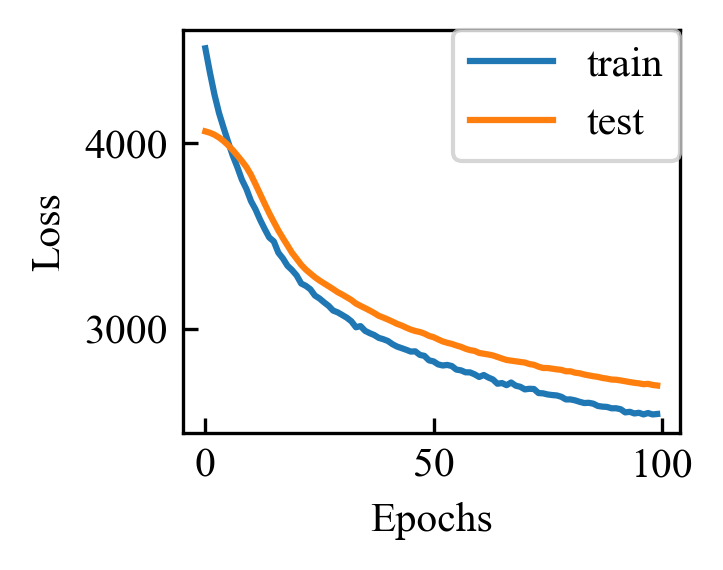

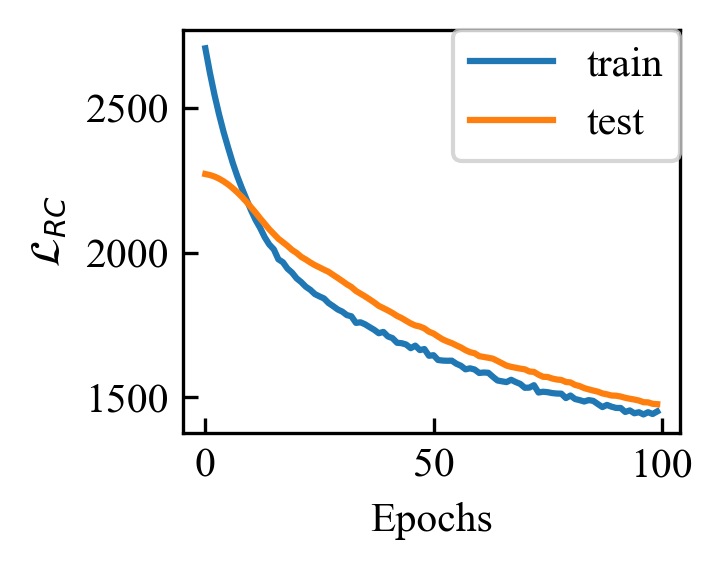

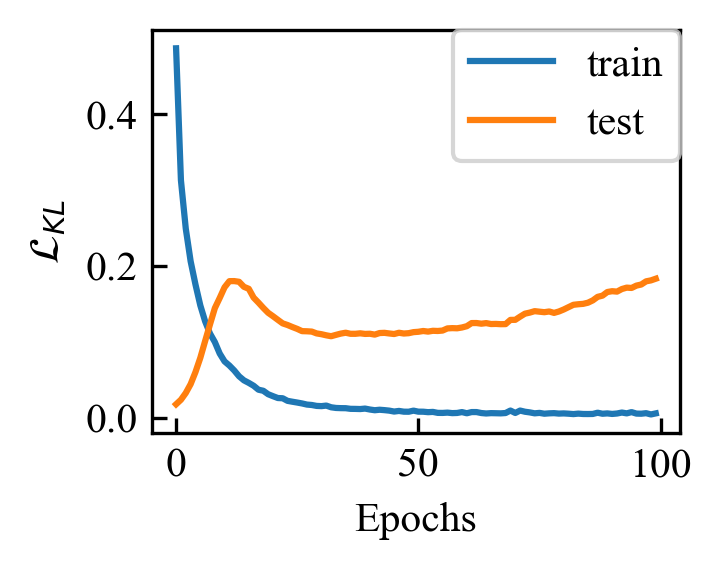

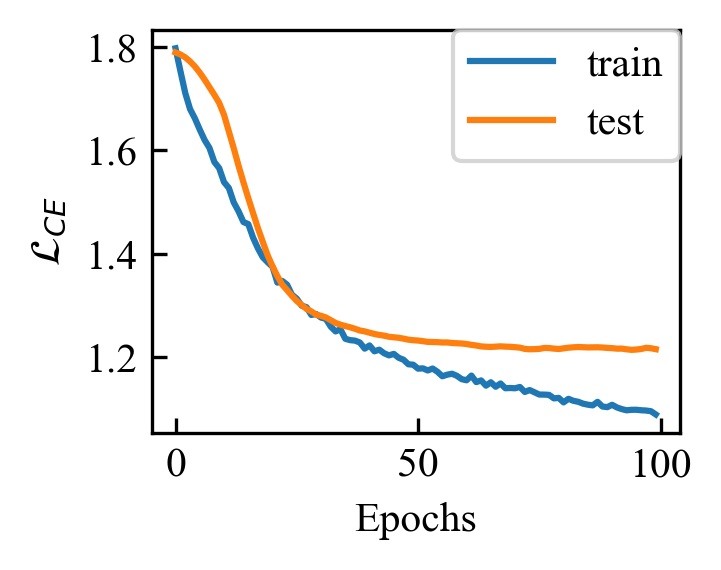

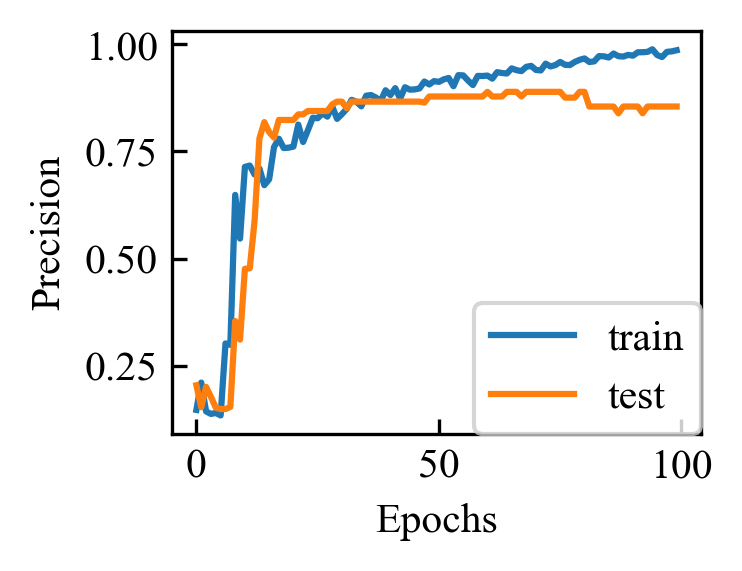

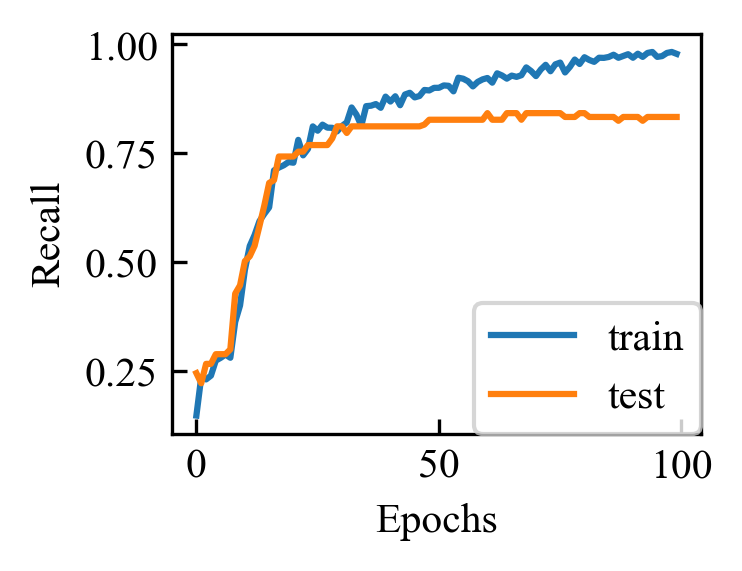

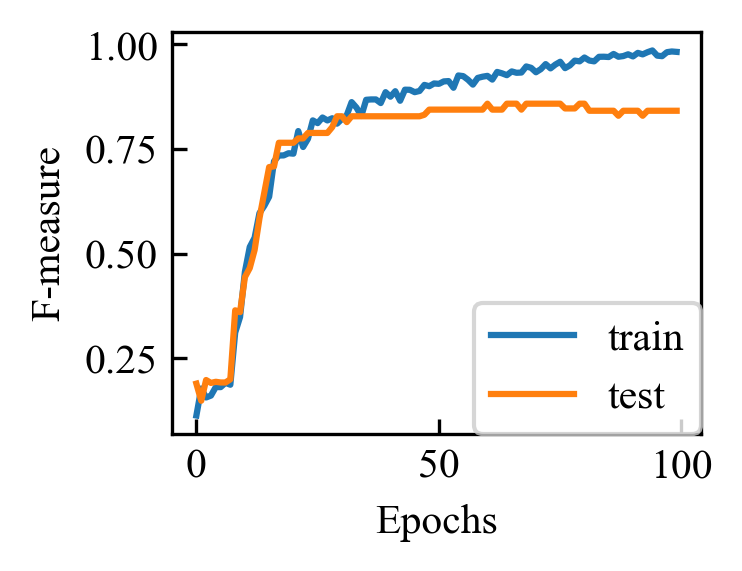

In [150]:
plot_every_epoch(history['train_loss'],history['test_loss'],EPOCH_NUM,'train','test','Loss',DIR_OUT+'loss.png',loc='upper right')
plot_every_epoch(history['train_recon_loss'],history['test_recon_loss'],EPOCH_NUM,'train','test','$\mathcal{L}_{RC}$',DIR_OUT+'loss_rc.png',loc='upper right')
plot_every_epoch(history['train_kl_gauss'],history['test_kl_gauss'],EPOCH_NUM,'train','test','$\mathcal{L}_{KL}$',DIR_OUT+'loss_kl.png',loc='upper right')
plot_every_epoch(history['train_Xent'],history['test_Xent'],EPOCH_NUM,'train','test','$\mathcal{L}_{CE}$',DIR_OUT+'loss_ce.png',loc='upper right')
plot_every_epoch(history['train_precision'],history['test_precision'],EPOCH_NUM,'train','test','Precision',DIR_OUT+'score_precision.png',bbox_to_anchor=(1,0),loc='lower right')
plot_every_epoch(history['train_recall'],history['test_recall'],EPOCH_NUM,'train','test','Recall',DIR_OUT+'score_recall.png',bbox_to_anchor=(1,0),loc='lower right')
plot_every_epoch(history['train_f1'],history['test_f1'],EPOCH_NUM,'train','test','F-measure',DIR_OUT+'score_f1.png',bbox_to_anchor=(1,0),loc='lower right')

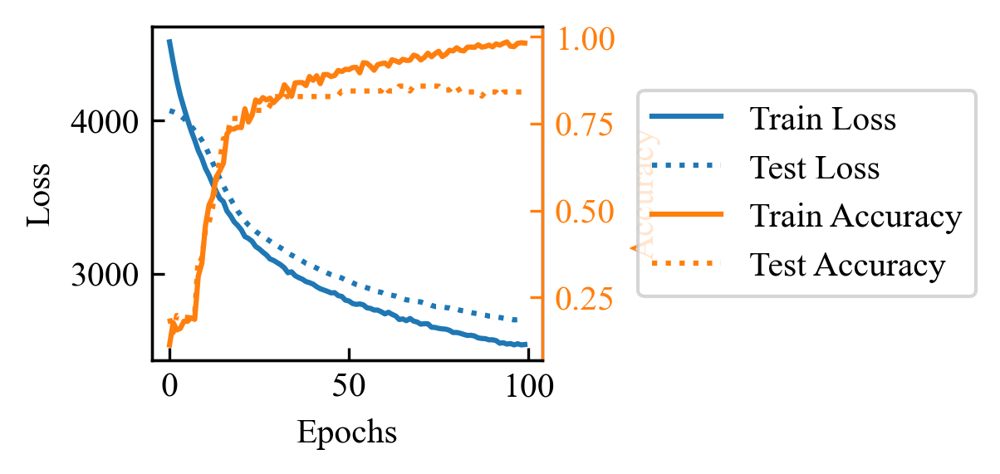

In [151]:
fig = plt.figure(figsize=(4.5,2),dpi=300)
ax = fig.add_subplot(111)
ax.plot(range(EPOCH_NUM),history['train_loss'],label='Train Loss')
ax.plot(range(EPOCH_NUM),history['test_loss'],label='Test Loss',color='tab:blue',linestyle=':')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
plt.grid(b=False)
handle1, label1 = ax.get_legend_handles_labels()
ax = ax.twinx()
ax.plot(range(EPOCH_NUM),history['train_f1'],label='Train Accuracy',color='tab:orange')
ax.plot(range(EPOCH_NUM),history['test_f1'],label='Test Accuracy',color='tab:orange',linestyle=':')
ax.spines['right'].set_color('tab:orange')
ax.tick_params(axis='y',colors='tab:orange')
handle2, label2 = ax.get_legend_handles_labels()
ax.legend(handle1+handle2,label1+label2,bbox_to_anchor=(1.2,0.5),loc=6)
ax.set_ylabel('Accuracy',color='tab:orange')
fig.tight_layout()
plt.grid(b=False)
plt.savefig(DIR_OUT+'loss_acc.png',bbox_inches='tight',pad_inches=0.05)
plt.savefig(DIR_OUT+'loss_acc.svg',bbox_inches='tight',pad_inches=0.05)
# subprocess.call('inkscape -M '+DIR_OUT+'loss_acc.emf '+DIR_OUT+'loss_acc.svg',shell=True)
plt.show()
plt.close()

## 推論

### モデルを推論モードに設定 : model.eval()

In [161]:
# 推論モードでcpuを使用
device = torch.device('cpu')
print(device)

#推論モードに設定（Dropout、BN、他の無効化）
px_z.eval().to(device)
pz_y.eval().to(device)
qy_x.eval().to(device)
qz_xy.eval().to(device)

cpu


Qz_xy(
  (conv_e): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
  )
  (fc1): Sequential(
    (0): Linear(in_features=24576, out_features=40, bias=True)
  )
  (fc2): Sequential(
    (0): Linear(in_features=24576, out_features=6, bias=True)
  )
  (fc): Sequential(
    (0): Linear(in_features=46, out_features=1024, bias=True)
    (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Linear(in_features=1024, out_features=4, bias=True)
  )
)

### 推論

In [162]:
from datetime import datetime
import csv

ltrain_pred = []
ztrain_pred = []
train_datatime_idx = []

#2021.2.5追記 qy_xによる予測も出力
ltrain_qy_x = []
ztrain_pz_y = []
#count=0
for x, t, datatime_idx in train_loader:
    #print(datatime_idx.detach().cpu().numpy())
    x = x.to(device)
    y = qy_x(x)
    with torch.no_grad():
        z = qz_xy(x, y)
    y_label_onehot = torch.eye(K)[t].to(device)
    with torch.no_grad():
        pz_y_out = pz_y(y_label_onehot) #この分布にqz_xyを近づけようと学習していたはず

    #print(f"y[0]:{y[0]}")
    if PLOT_RECON:
        recon_x_train = px_z(z) # reconstruction
        #print(f"recon_x_train.shape : {recon_x_train.shape}")
        #reconst_plot(x,recon_x_train,DIR_OUT+'figs/',125,WAVELET_HEIGHT,WAVELET_WIDTH,BATCH_SIZE,count,mode='train')
        reconst_plot(x,recon_x_train,DIR_OUT+'figs/',125,WAVELET_HEIGHT,WAVELET_WIDTH,datatime_idx,mode='train')
    ztrain_pred.extend(z.detach().cpu().numpy())
    ltrain_pred.extend(t.numpy())
    train_datatime_idx.extend(datatime_idx.numpy())
    ltrain_qy_x.extend(y.argmax(dim=1).numpy()) #2021.2.5
    ztrain_pz_y.extend(pz_y_out.detach().cpu().numpy())
    #count += 1
ltrain_pred = np.array(ltrain_pred)
ztrain_pred = np.array(ztrain_pred)
train_datatime_idx = np.array(train_datatime_idx)
ltrain_qy_x = np.array(ltrain_qy_x)
ztrain_pz_y = np.array(ztrain_pz_y)

ltest_pred = []
ztest_pred = []
test_datatime_idx = []
#2021.2.5追記 qy_xによる予測も出力
ltest_qy_x = []
count=0
for x, t, datatime_idx in test_loader:
    x = x.to(device)
    y = qy_x(x)
    with torch.no_grad():
        z = qz_xy(x, y)
    if PLOT_RECON:
        recon_x_test = px_z(z)
        #reconst_plot(x,recon_x_test,DIR_OUT+'figs/',125,WAVELET_HEIGHT,WAVELET_WIDTH,BATCH_SIZE,count,mode='test')
        reconst_plot(x,recon_x_test,DIR_OUT+'figs/',125,WAVELET_HEIGHT,WAVELET_WIDTH,datatime_idx,mode='test')
    ztest_pred.extend(z.detach().cpu().numpy())
    ltest_pred.extend(t.numpy())
    test_datatime_idx.extend(datatime_idx.numpy())
    ltest_qy_x.extend(y.argmax(dim=1).numpy()) #2021.2.5
    count += 1
ltest_pred = np.array(ltest_pred)
ztest_pred = np.array(ztest_pred)
test_datatime_idx = np.array(test_datatime_idx)
ltest_qy_x = np.array(ltest_qy_x)

test_accuracy = accuracy_score(ltest_pred,ltest_qy_x)
if not os.path.isfile(DIR_OUT+'accuracy_score.csv'):
    with open(DIR_OUT+'accuracy_score.csv',mode='w',newline='') as f:
        dt_now = datetime.now()
        writer = csv.writer(f)
        writer.writerow([str(test_accuracy), dt_now.strftime('%Y-%m-%d %H:%M:%S')])
else:
    with open(DIR_OUT+'accuracy_score.csv',mode='a',newline='') as f:
        dt_now = datetime.now()
        writer = csv.writer(f)
        writer.writerow([str(test_accuracy), dt_now.strftime('%Y-%m-%d %H:%M:%S')])

### 潜在空間の可視化：p(z|y)の分布

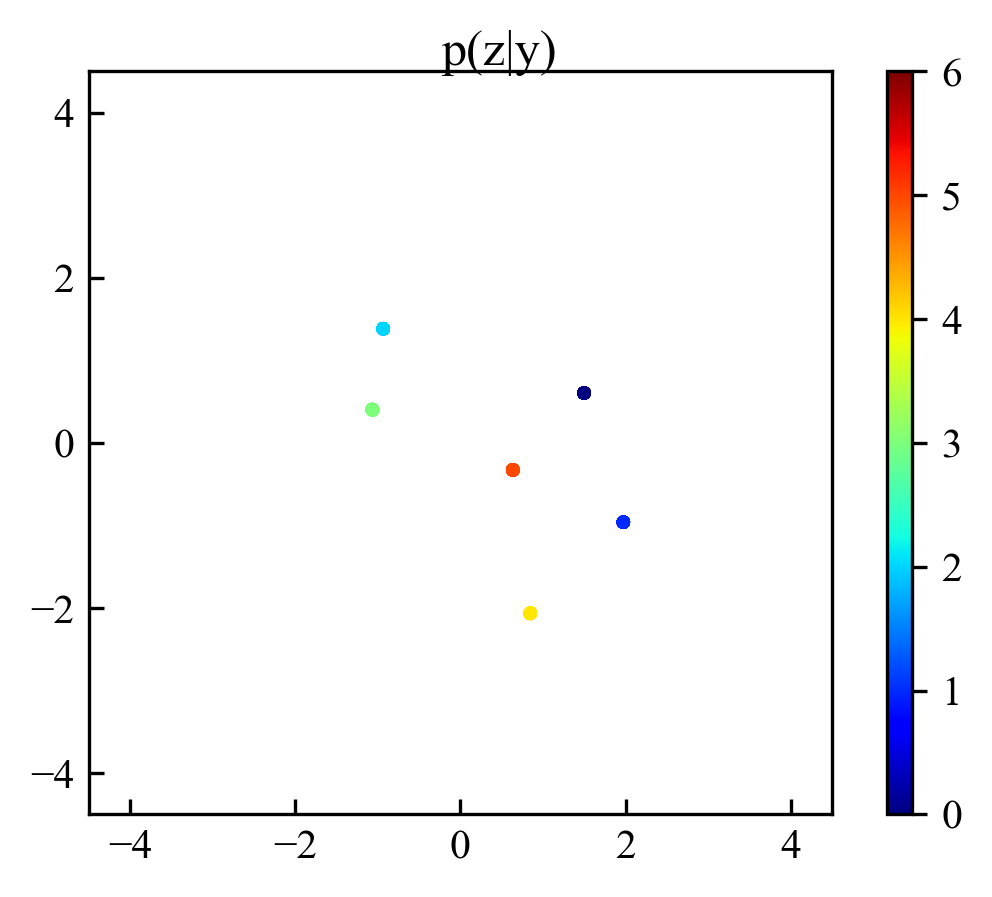

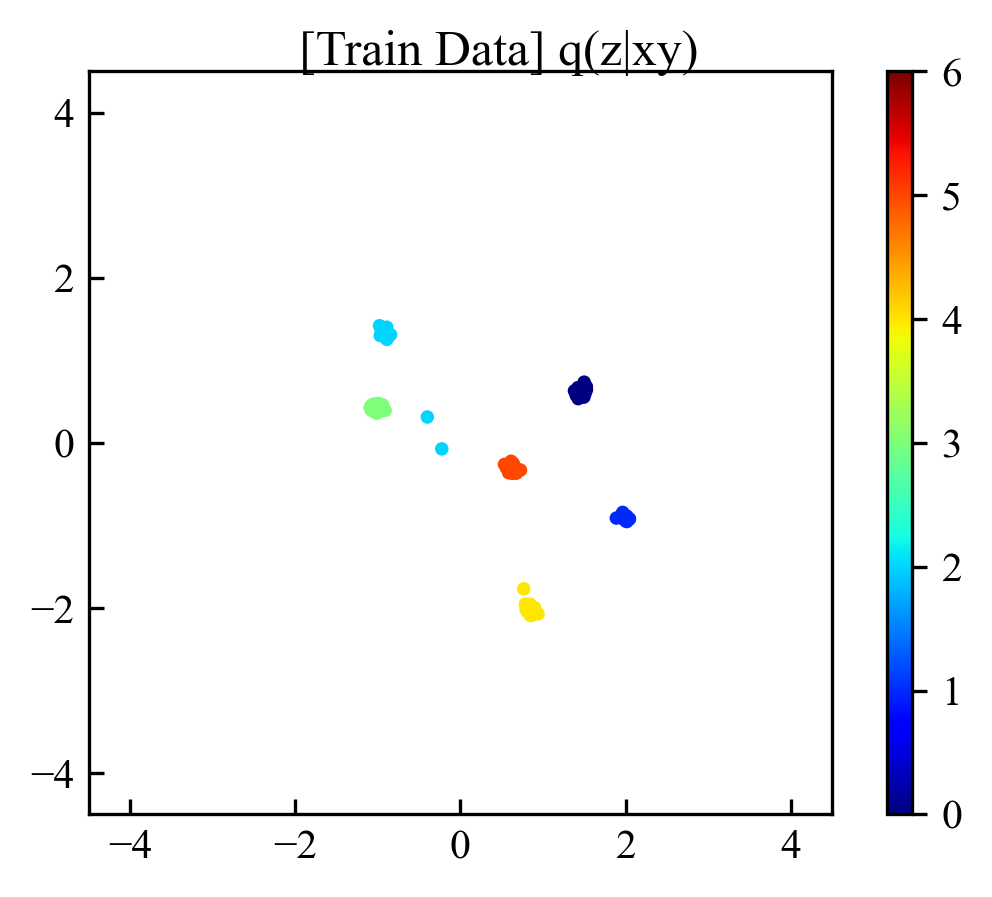

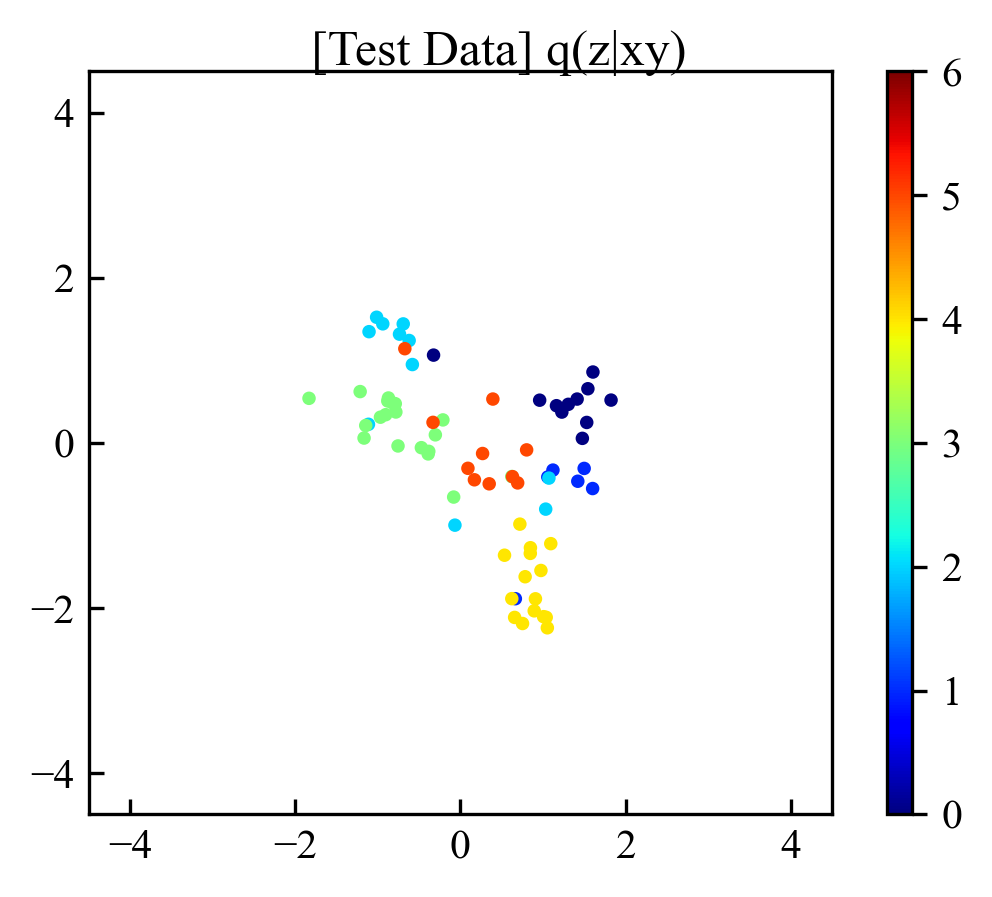

In [163]:
# カラーマップの指定
import matplotlib.cm as cm
from matplotlib.colors import rgb2hex, ListedColormap, Normalize
from matplotlib import ticker

colors = plt.cm.get_cmap('hsv')
colors20 = plt.cm.get_cmap('tab20')
cmap = cm.get_cmap('hsv',21)
color_code = []
for i in range(cmap.N):
    rgb = cmap(i)[:3]
    color_code.append(rgb2hex(rgb))

    cmap = ListedColormap(color_code)
    bounds = list(range(0,21))
    #norm = BoundaryNorm(bounds, cmap.N)
    mycolormap = plt.cm.get_cmap('jet')

fig = plt.figure(num=None, figsize=(4, 3), dpi=300, facecolor='w', edgecolor='k')
subxy = 2 if Z_DIM > 2 else 1
ax = plt.subplot(subxy, subxy, 1)
for i in range(Y_DIM):
    zplot = ztrain_pz_y[ltrain_pred == i]
    #ax.scatter(zplot[:, 0], zplot[:, 1], s=5, label=i, color=colors(2*i/(Y_DIM*2)))
    #sc = ax.scatter(zplot[:, 0], zplot[:, 1], s=5, c=c, cmap=colors20,norm=norm,vmin=min(bounds),vmax=max(bounds))
    num = zplot.shape[0]
    c = np.full(num,i)
    # sc = ax.scatter(zplot[:, 0], zplot[:, 1], s=5, c=c, cmap=colors20,norm=Normalize(vmin=0,vmax=19))
    sc = ax.scatter(zplot[:, 0], zplot[:, 1] ,s=5,c=c,cmap=mycolormap,norm=Normalize(vmin=0,vmax=Y_DIM)) # 20超えたから連続カラーマップで...
    #zplot = np.vstack((zplot[:,0],zplot[:,1])).T
    #zavg = zplot.sum(axis=0)/zplot.shape[0]
    #ax.annotate(str(i),zavg)
    #zplot = ztest_pred[ltest_pred == i]
    #ax.scatter(zplot[:, 0], zplot[:, 1], s=5, label=i, c=colors[i + Y_DIM])
    #plt.legend()
ax.set_xlim(-4.5,4.5)
ax.set_ylim(-4.5,4.5)
ax.set_aspect('equal',adjustable='box')
cbar = fig.colorbar(sc,aspect=30)
cbar.ax.tick_params(direction='out')
cbar.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))

if Z_DIM > 2:
    ax = plt.subplot(subxy, subxy, 2)
    for i in range(Y_DIM):
        zplot = ztrain_pz_y[ltrain_pred == i]
        ax.scatter(zplot[:, 0], zplot[:, 2], s=5, label=i,color=colors(2*i/(Y_DIM*2)))
        zplot = np.vstack((zplot[:,0],zplot[:,2])).T
        zavg = zplot.sum(axis=0)/zplot.shape[0]
        ax.annotate(str(i),zavg)
        #zplot = ztest_pred[ltest_pred == i]
        #ax.scatter(zplot[:, 0], zplot[:, 2], s=5, label=i, c=colors[i + Y_DIM])
        plt.legend()
    ax = plt.subplot(subxy, subxy, 3)
    for i in range(Y_DIM):
        zplot = ztrain_pz_y[ltrain_pred == i]
        ax.scatter(zplot[:, 1], zplot[:, 2], s=5, label=i, color=colors(2*i/(Y_DIM*2)))
        zplot = np.vstack((zplot[:,1],zplot[:,2])).T
        zavg = zplot.sum(axis=0)/zplot.shape[0]
        ax.annotate(str(i),zavg)
        #zplot = ztest_pred[ltest_pred == i]
        #ax.scatter(zplot[:, 1], zplot[:, 2], s=5, label=i, c=colors[i + Y_DIM])
        plt.legend()
fig.tight_layout()
fig.suptitle('p(z|y)')
# fig.savefig(DIR_OUT+"VAEclustering_2d_Qz_y_sma"+str(SMA_NUM)+".png")


fig2 = plt.figure(num=None, figsize=(4, 3), dpi=300, facecolor='w', edgecolor='k')
subxy = 2 if Z_DIM > 2 else 1
ax = plt.subplot(subxy, subxy, 1)
for i in range(Y_DIM):
    zplot = ztrain_pred[ltrain_pred == i]
    """ax.scatter(zplot[:, 0], zplot[:, 1], s=5, label=i, color=colors(2*i/(Y_DIM*2)))
    zplot = np.vstack((zplot[:,0],zplot[:,1])).T
    zavg = zplot.sum(axis=0)/zplot.shape[0]
    ax.annotate(str(i),zavg)"""
    num = zplot.shape[0]
    c = np.full(num,i)
    # sc = ax.scatter(zplot[:, 0], zplot[:, 1], s=5, c=c, cmap=colors20,norm=Normalize(vmin=0,vmax=19))
    sc = ax.scatter(zplot[:, 0], zplot[:, 1] ,s=5,c=c,cmap=mycolormap,norm=Normalize(vmin=0,vmax=Y_DIM)) # 20超えたから連続カラーマップで...
    #zplot = ztest_pred[ltest_pred == i]
    #ax.scatter(zplot[:, 0], zplot[:, 1], s=5, label=i, c=colors[i + Y_DIM])
    #plt.legend()
ax.set_xlim(-4.5,4.5)
ax.set_ylim(-4.5,4.5)
ax.set_aspect('equal',adjustable='box')
cbar = fig2.colorbar(sc,aspect=30)
cbar.ax.tick_params(direction='out')
cbar.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
if Z_DIM > 2:
    ax = plt.subplot(subxy, subxy, 2)
    for i in range(Y_DIM):
        zplot = ztrain_pred[ltrain_pred == i]
        ax.scatter(zplot[:, 0], zplot[:, 2], s=5, label=i,color=colors(2*i/(Y_DIM*2)))
        zplot = np.vstack((zplot[:,0],zplot[:,2])).T
        zavg = zplot.sum(axis=0)/zplot.shape[0]
        ax.annotate(str(i),zavg)
        #zplot = ztest_pred[ltest_pred == i]
        #ax.scatter(zplot[:, 0], zplot[:, 2], s=5, label=i, c=colors[i + Y_DIM])
        plt.legend()
    ax = plt.subplot(subxy, subxy, 3)
    for i in range(Y_DIM):
        zplot = ztrain_pred[ltrain_pred == i]
        ax.scatter(zplot[:, 1], zplot[:, 2], s=5, label=i, color=colors(2*i/(Y_DIM*2)))
        zplot = np.vstack((zplot[:,1],zplot[:,2])).T
        zavg = zplot.sum(axis=0)/zplot.shape[0]
        ax.annotate(str(i),zavg)
        #zplot = ztest_pred[ltest_pred == i]
        #ax.scatter(zplot[:, 1], zplot[:, 2], s=5, label=i, c=colors[i + Y_DIM])
        plt.legend()
fig2.tight_layout()
fig2.suptitle('[Train Data] q(z|xy)')
# fig2.savefig(DIR_OUT+"VAEclustering_2d_train_sma"+str(SMA_NUM)+".png")

fig3 = plt.figure(num=None, figsize=(4, 3), dpi=300, facecolor='w', edgecolor='k')
subxy = 2 if Z_DIM > 2 else 1
#print(f"Y_DIM{Z_DIM}, subxy{subxy}")
ax = plt.subplot(subxy, subxy, 1)
for i in range(Y_DIM):
    #zplot = ztrain_pred[ltrain_pred == i]
    #ax.scatter(zplot[:, 0], zplot[:, 1], s=5, label=i, c=colors[i])
    zplot = ztest_pred[ltest_pred == i]
    """ax.scatter(zplot[:, 0], zplot[:, 1], s=5, label=i, color=colors((2*i+1)/(Y_DIM*2)))
    zplot = np.vstack((zplot[:,0],zplot[:,1])).T
    zavg = zplot.sum(axis=0)/zplot.shape[0]
    ax.annotate(str(i),zavg)"""
    num = zplot.shape[0]
    c = np.full(num,i)
    # sc = ax.scatter(zplot[:, 0], zplot[:, 1], s=5, c=c, cmap=colors20,norm=Normalize(vmin=0,vmax=19))
    sc = ax.scatter(zplot[:, 0], zplot[:, 1] ,s=5,c=c,cmap=mycolormap,norm=Normalize(vmin=0,vmax=Y_DIM)) # 20超えたから連続カラーマップで...

ax.set_xlim(-4.5,4.5)
ax.set_ylim(-4.5,4.5)
ax.set_aspect('equal',adjustable='box')
cbar = fig3.colorbar(sc,aspect=30)
cbar.ax.tick_params(direction='out')
cbar.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
#plt.legend()

if Z_DIM > 2:
    ax = plt.subplot(subxy, subxy, 2)
    for i in range(Y_DIM):
        #zplot = ztrain_pred[ltrain_pred == i]
        #ax.scatter(zplot[:, 0], zplot[:, 2], s=5, label=i, c=colors[i])
        zplot = ztest_pred[ltest_pred == i]
        ax.scatter(zplot[:, 0], zplot[:, 2], s=5, label=i, color=colors((2*i+1)/(Y_DIM*2)))
        zplot = np.vstack((zplot[:,0],zplot[:,2])).T
        zavg = zplot.sum(axis=0)/zplot.shape[0]
        ax.annotate(str(i),zavg)
        plt.legend()
    ax = plt.subplot(subxy, subxy, 3)
    for i in range(Y_DIM):
        #zplot = ztrain_pred[ltrain_pred == i]
        #ax.scatter(zplot[:, 1], zplot[:, 2], s=5, label=i, c=colors[i])
        zplot = ztest_pred[ltest_pred == i]
        ax.scatter(zplot[:, 1], zplot[:, 2], s=5, label=i, color=colors((2*i+1)/(Y_DIM*2)))
        zplot = np.vstack((zplot[:,1],zplot[:,2])).T
        zavg = zplot.sum(axis=0)/zplot.shape[0]
        ax.annotate(str(i),zavg)
        plt.legend()
fig3.tight_layout()
fig3.suptitle('[Test Data] q(z|xy)')
# fig3.savefig(DIR_OUT+"VAEclustering_2d_test_sma"+str(SMA_NUM)+".png")
plt.show()

### 推論結果をcsvに保存

In [164]:
output_fp = open(DIR_OUT+"result_train.csv", 'w')
for label_i, latent_i, datatime_i, label_pred in zip(ltrain_pred, ztrain_pred, train_datatime_idx, ltrain_qy_x):
    output_fp.write(str(label_i))
    output_fp.write(",")
    output_fp.write(str(label_pred))
    output_fp.write(",")
    for latent_val in latent_i:
        output_fp.write(str(latent_val))
        output_fp.write(",")
    output_fp.write(str(datatime_i))
    output_fp.write("\n")
output_fp.close()

output_fp = open(DIR_OUT+"result_test.csv", 'w')
for label_i, latent_i, datatime_i, label_pred in zip(ltest_pred, ztest_pred, test_datatime_idx, ltest_qy_x):
    output_fp.write(str(label_i))
    output_fp.write(",")
    output_fp.write(str(label_pred))
    output_fp.write(",")
    for latent_val in latent_i:
        output_fp.write(str(latent_val))
        output_fp.write(",")
    output_fp.write(str(datatime_i))
    output_fp.write("\n")
output_fp.close()